## Preamble

In [1]:
vmin=490.8
vmax=1990

h=6

nz=259; nx=1111

dt=0.0018
nt=5554  #10 s

ntr=2220

In [2]:
import numpy as np
import matplotlib.pyplot as plt


z=np.arange(0,nz)*h
x=np.arange(0,nx)*h

def read(filename,n=(nx,nz)):
    return np.fromfile(filename,dtype='float32').reshape(n).T

def read_su(filename,n=(ntr,nt)):
    data=read(filename,n=(n[0],int(60+n[1])))
    return data[60:,:]

def imshow(data,perc=None,clip=None,clipmin=None,extent=None,cmap='viridis',title=None,title_colorbar=None,grid=True):
    if perc==None:
        clipp=[np.amin(data),np.amax(data)]
    else:
        tmp=np.percentile(np.abs(data),q=perc)
        clipp=[-tmp,tmp]
    
    if clip!=None: clipp=clip
    
    if clipmin!=None: clipp[0]=clipmin
    
    plt.imshow(data,vmin=clipp[0],vmax=clipp[1],cmap=cmap,extent=extent,aspect='auto')
    cbar=plt.colorbar(location='right')
    cbar=cbar.ax.set_ylabel(title_colorbar)
    if grid==True: plt.grid(visible=grid, axis='both', which='both', color='w', linestyle='--',linewidth=0.5)
    #plt.xlabel(labels[0]); plt.ylabel(labels[1])
    if title!=None: plt.title(title)

def run(app='../../exe/FWD',setup='setup',np=1,nthreads=8,out=None):
    '''
    run(app,setup,np=1,nthreads=8)
    run in a bash env
    ----------------------------
    app      : application/executable to run
    setup    : setup file
    np       : number of MPI processors (default=1)
    nthreads : number of OpenMP threads (default=8)
    
    Caveat: np*nthreads should not exceed total number of CPU cores
    otherwise the running will be very slow
    '''
    
    !echo 'ulimit -s unlimited' > run.sh
    str=f"export OMP_NUM_THREADS={nthreads}"
    !echo $str >> run.sh
    str=f"{app} {setup}"
    !echo $str >> run.sh
    !chmod +x run.sh
    if out==None:
        !./run.sh
    else:
        !./run.sh > {out}

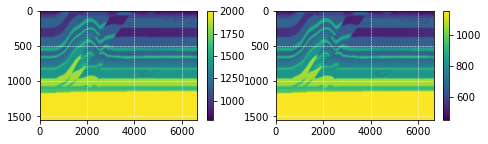

In [3]:
#plot
plt.figure(figsize=(12,2))
true=read('true',(3*nx,nz))
plt.subplot(1,3,1); imshow(true[:,:nx],clip=[788,2000],extent=(0,(nx-1)*h,(nz-1)*h,0))
plt.subplot(1,3,2); imshow(true[:,nx:2*nx],clip=[455,1154],extent=(0,(nx-1)*h,(nz-1)*h,0))

In [4]:
!cat setup_default_overthrust

MODEL_SIZE              '259  1111 1'
MODEL_SPACING           '6    6    1'
FILE_MODEL              'true'
MODEL_ATTRIBUTES        'vp vs rho'
MODEL_ATTRIBUTES_WRITE  'vp vs'
FILE_TOPO                none

IS_FREESURFACE          T

ACQUI_GEOMETRY          spread
FS                      '  0   166.5  0'
DS                      '  0   166.5  0'
NS                      39
FR                      '  0     0  0'
DR                      '  0     3  0'
NR                      2220

SCOMP                    pz
RCOMP                   'pz px ex'

NT           5554
DT           0.0018

WAVELET_TYPE	ricker


#############
## for FWI ##
#############
FILE_DATA_PREFIX    './res_obs/Ru_Shot'
NBATCH               39
WEIGHTING           'none'

FPEAK           6.54

PARAMETER           'vp:850:1990 vs:490.75:1148.93'

IF_PARA_SCAL         T

SMOOTHING            Laplacian
LAP_FRAC         '0.1 0.1 0.1'

#PRECO           'z^0'

JOB             gradient

#SNAPSHOT     'p vz'
#NSNAPSHOT    50

MAX_ITERA

In [5]:
!bash recompile.sh

rm *.o

rm ../../mod/m_model.mod ../../mod/m_shotlist_batching.mod ../../mod/m_shot.mod ../../mod/m_computebox.mod ../../mod/m_field.mod ../../mod/m_correlate.mod ../../mod/m_cpml.mod ../../mod/m_propagator_PSV_FDSG_O4.mod ../../mod/m_Modeling.mod ../../mod/m_shotlist.mod ../../mod/m_cpml.mod ../../mod/m_propagator.mod ../../mod/m_modeling.mod ../../mod/m_propagator_WPI.mod
rm: cannot remove '../../mod/m_shotlist_batching.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_PSV_FDSG_O4.mod': No such file or directory
rm: cannot remove '../../mod/m_Modeling.mod': No such file or directory
rm: cannot remove '../../mod/m_cpml.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_WPI.mod': No such file or directory
make: [Makefile:24: clean] Error 1 (ignored)

(cd FWD; make)
make[1]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/FWD'
#System
(cd ../Modules/System; make)
make[2]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/Modules/S


mpif90 -cpp -Dgfortran -D"git_commit='f46818b'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_correlate.f90 -o m_correlate.o

mpif90 -cpp -Dgfortran -D"git_commit='f46818b'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_cpml.f90 -o m_cpml.o

mpif90 -cpp -Dgfortran -D"git_commit='f46818b'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_propagator_DAS_FDSG_O4.f90 -o m_propagator_DAS_FDSG_O4.o

mpif90 -cpp -Dgfortran -D"git_commit='f46818b'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_Modeling.f90 -o m_Modeling.o


make[2]: Leaving directo

## Valid PE vs VS -- far from FreeSurf

In [6]:
vp = np.interp(np.arange(ntr)/2, np.arange(nx), true[125,:nx    ] )
vs = np.interp(np.arange(ntr)/2, np.arange(nx), true[125,nx:2*nx] )

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

### vz or pz force

In [12]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 679256 Mar 29 15:14 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:16:25
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth
 Output directory:res_VS_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

In [13]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         pz" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:16:52
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth
 Output directory:res_PE_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

#### vz-szz

1.000014278752709


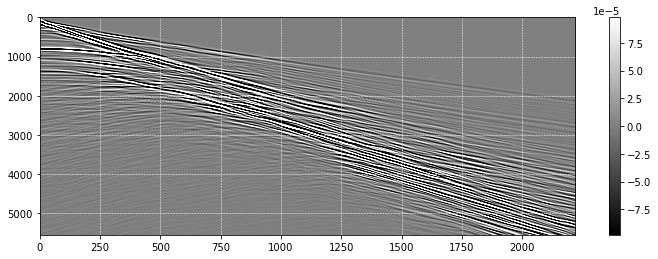

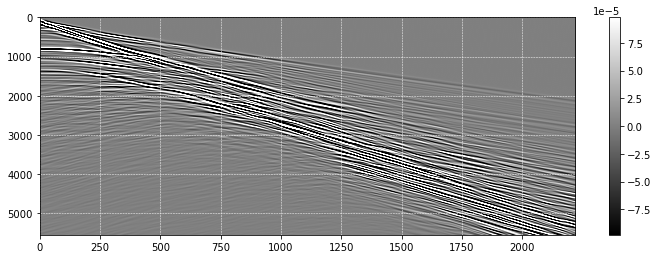

In [14]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

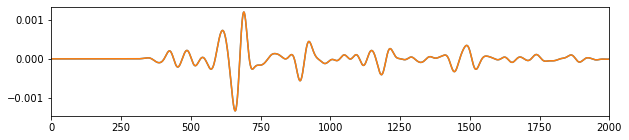

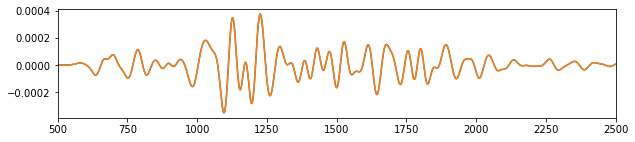

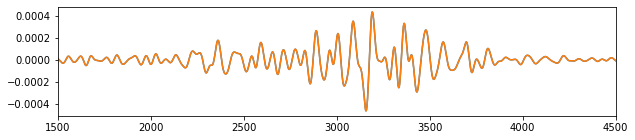

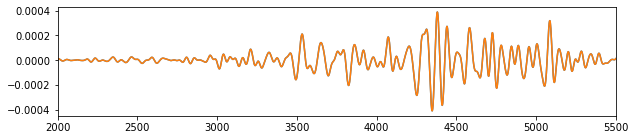

In [15]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-sxx

1.0001081172077593


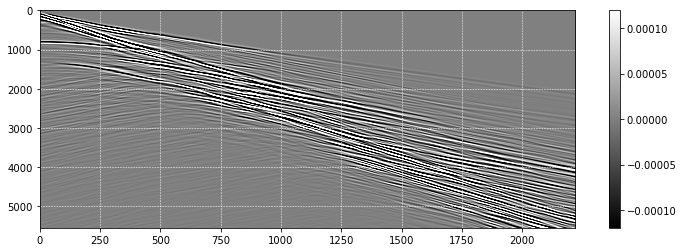

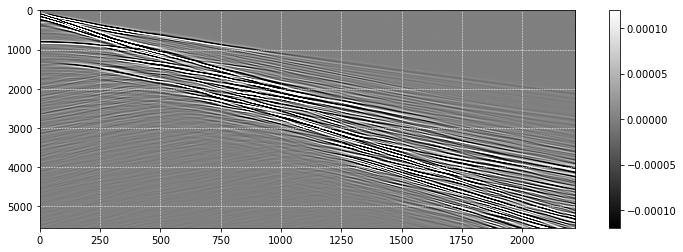

In [16]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

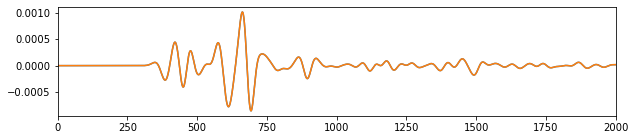

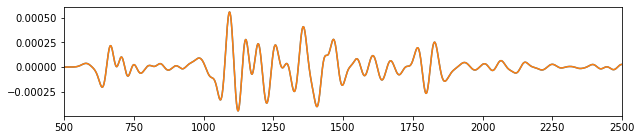

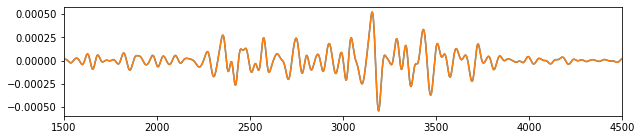

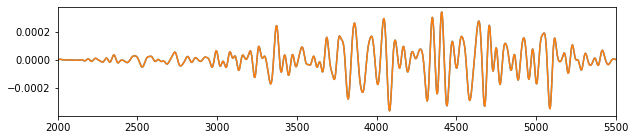

In [17]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ez

1.0000477432816706


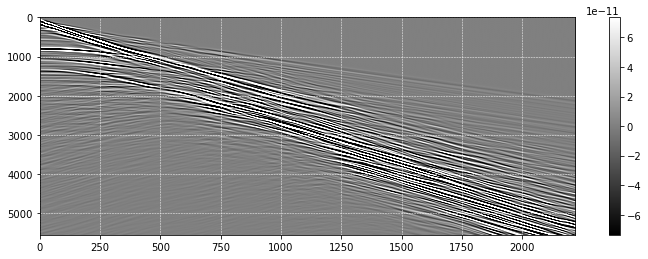

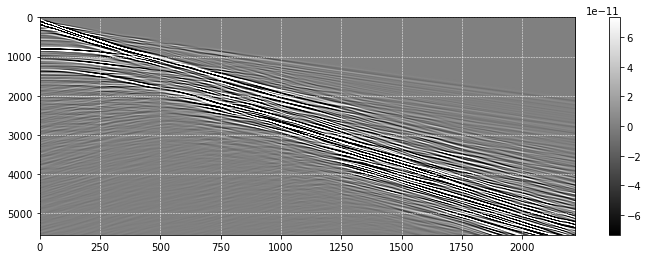

In [18]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

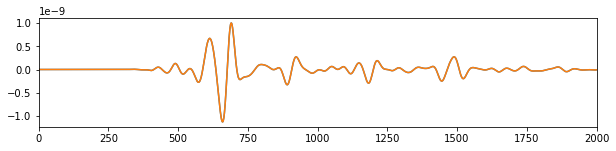

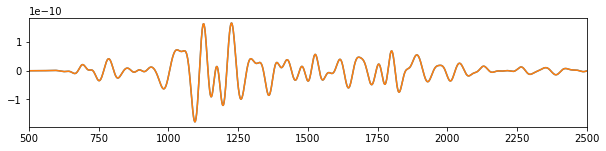

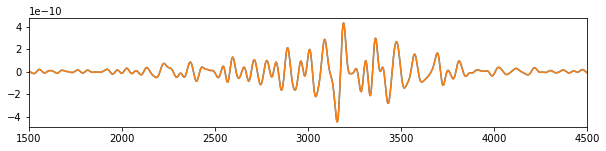

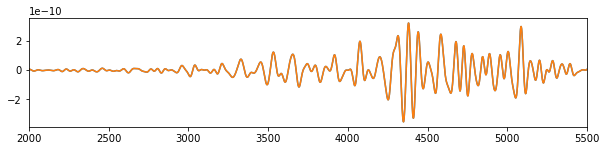

In [19]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ex

1.0001002371791674


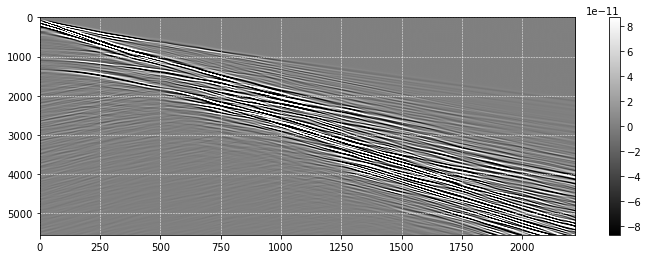

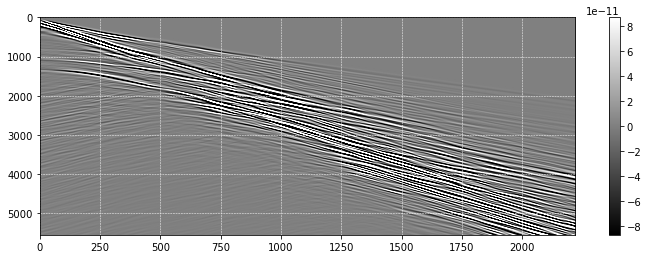

In [20]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

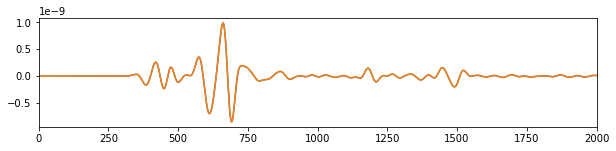

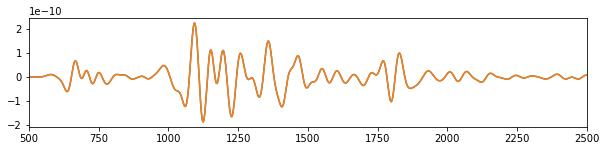

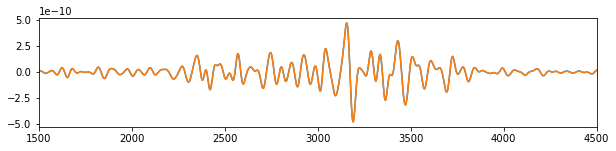

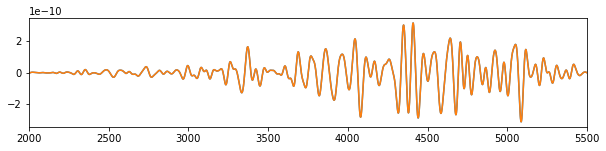

In [21]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ss-es

0.9996192774988328


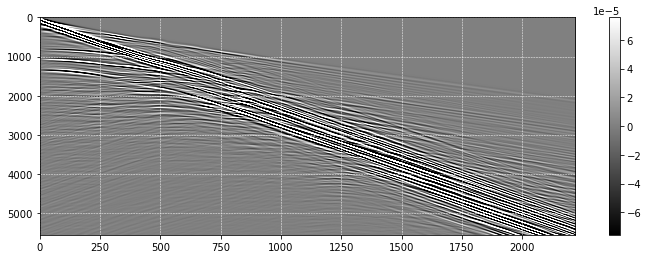

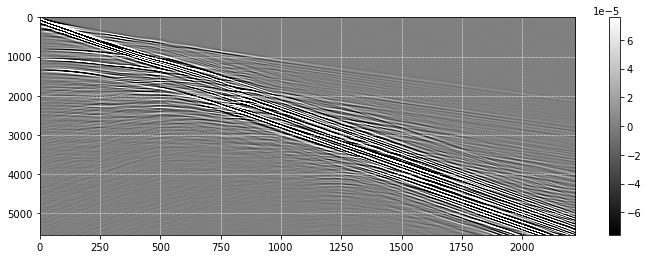

In [22]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

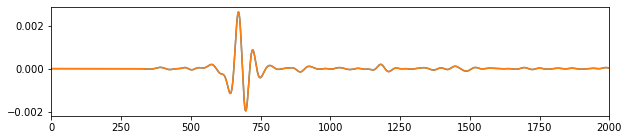

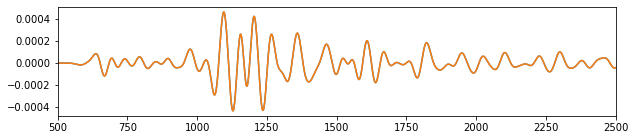

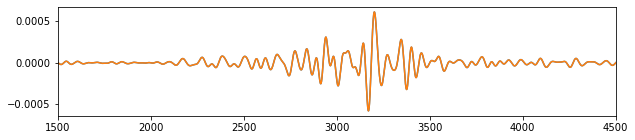

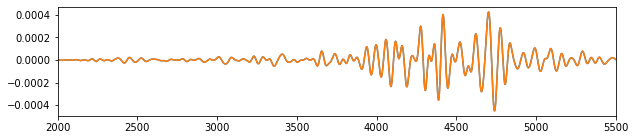

In [23]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

### vx or px force

In [24]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         vx" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth_vx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 679256 Mar 29 15:14 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:17:48
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_vx
 Output directory:res_VS_overth_vx/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

In [25]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         px" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth_px" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:18:15
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_px
 Output directory:res_PE_overth_px/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### vx-szz

0.999907432170211


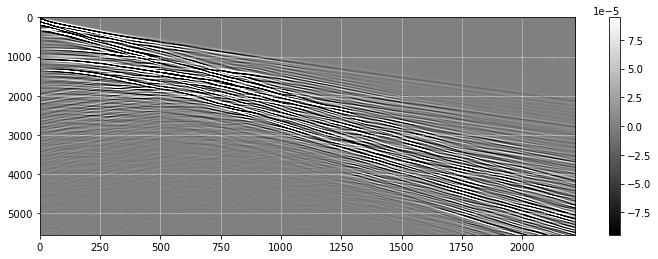

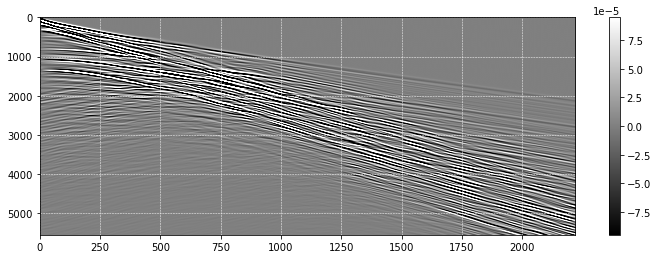

In [27]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

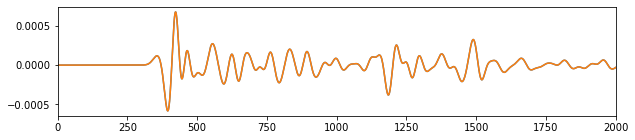

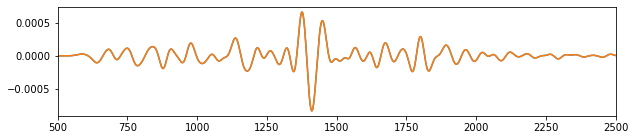

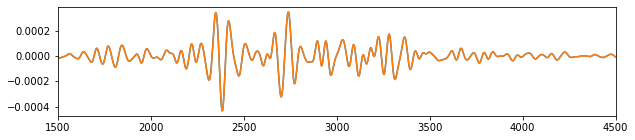

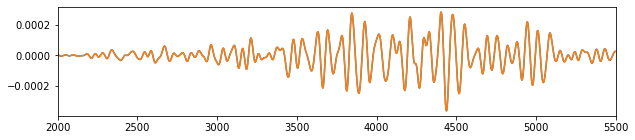

In [28]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-sxx

0.9998354736308077


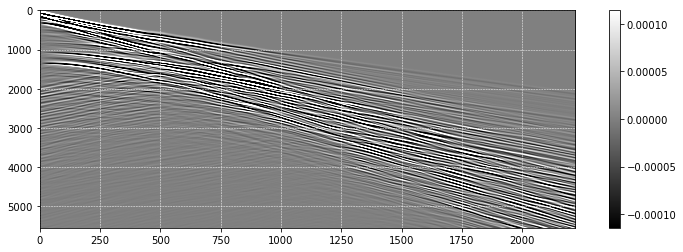

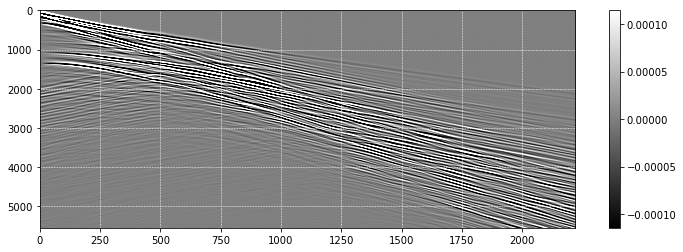

In [29]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

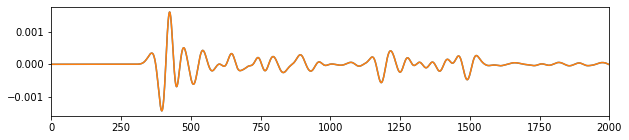

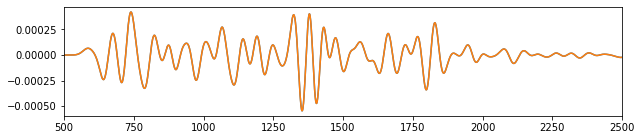

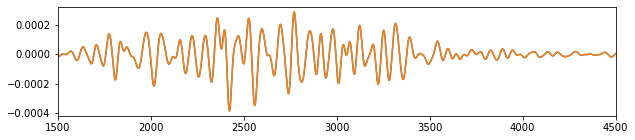

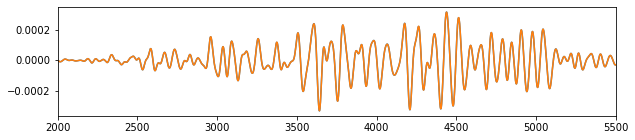

In [30]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ez

0.9999724056856973


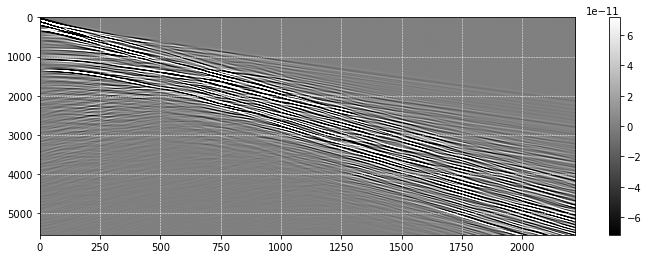

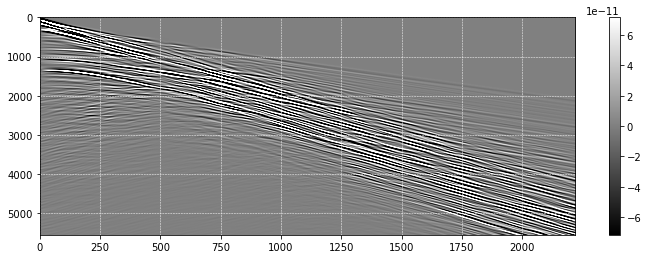

In [31]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

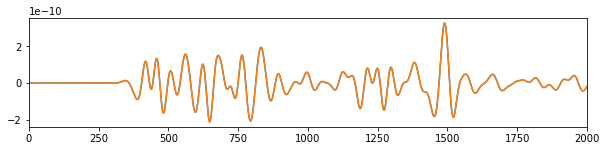

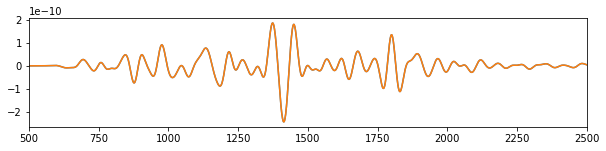

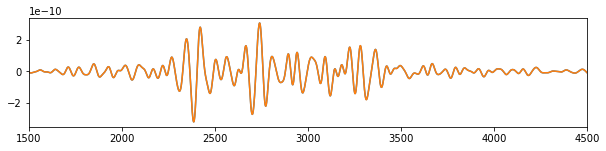

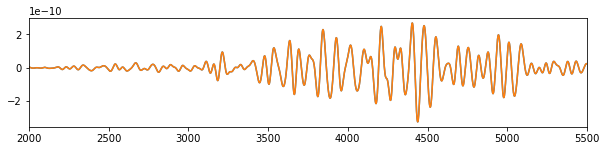

In [32]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ex

0.9998807906586877


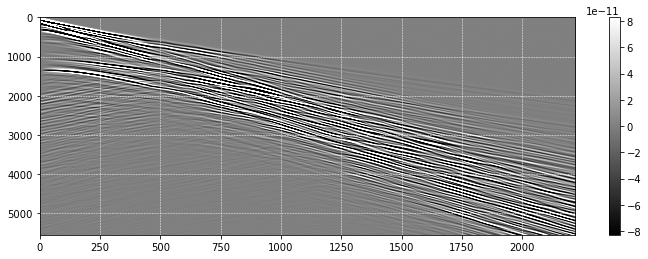

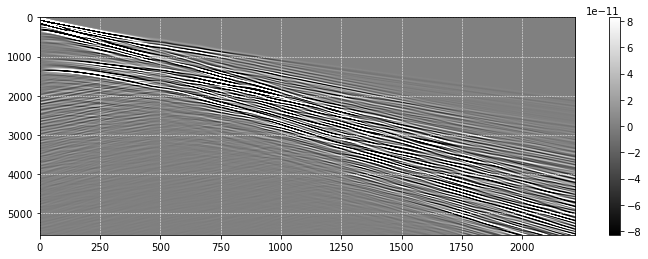

In [33]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

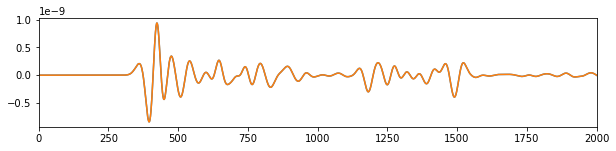

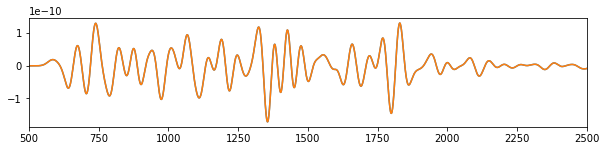

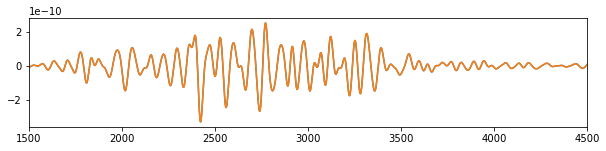

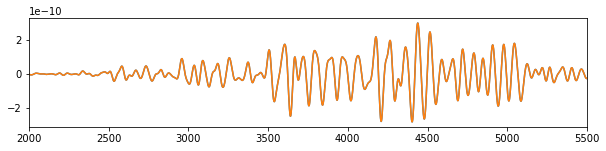

In [34]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ss-es

0.9995861748533145


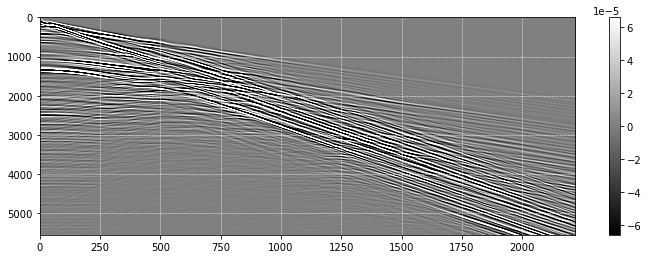

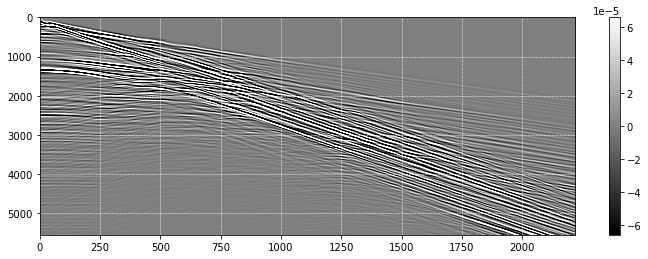

In [35]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

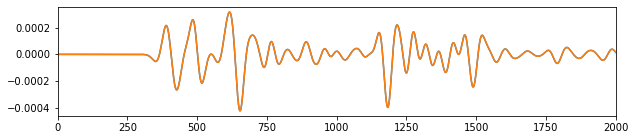

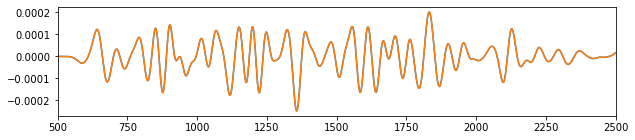

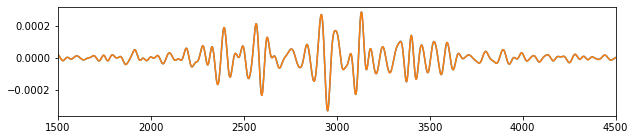

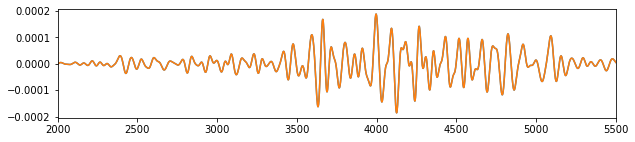

In [36]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

## Valid PE vs VS -- far from FreeSurf

In [37]:
vp = true[125,0 ]
vs = true[125,nx]

print(vp,vs)

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

1264.4324 730.0204


### ez source

In [73]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         szz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sz" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         sxx" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 679256 Mar 29 15:14 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:30:15
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_sz
 Output directory:res_VS_overth_sz/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

 Shot0001 info:
   nt,dt:        5554   1.79999997E-03
 ---------------------------------
 S/R positions after removing m%oz,ox,iy,
   sz,iz:   750.000000             126
   sx,ix:   0.00000000               1
   sy,iy:   0.00000000               1
   ifz,ilz:         122         130
   ifx,ilx:          -3           5
   ify,ily:           1           1
 ---------------------------------
   minmax rz,iz:   750.000000       750.000000             126         127
   minmax rx,ix:   0.00000000       6657.00000               1        1111
   minmax ry,iy:   0.00000000       0.00000000               1           1
   minmax ifz,ilz:         122         123         130         131
   minmax ifx,ilx:          -3        1107           5        1115
   minmax ify,ily:           1           1           1           1
   nrcv:        4440
 ---------------------------------
 Modeling Shot# Shot0001
 ADD_APERTURE is NOT found, take default: -99999 99999 -99999 99999
 REF_BNDLAYER_THICKNESS (NCPML) i

In [74]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         ez" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ez" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:31:00
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ez
 Output directory:res_PE_overth_ez/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ez-vz

1.0000721


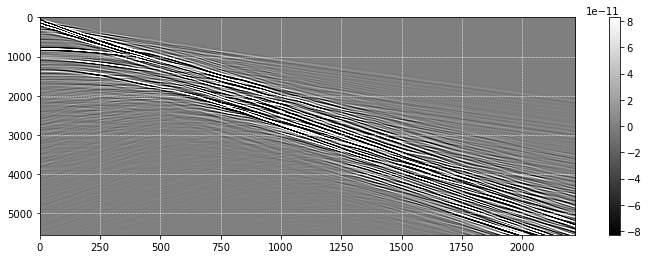

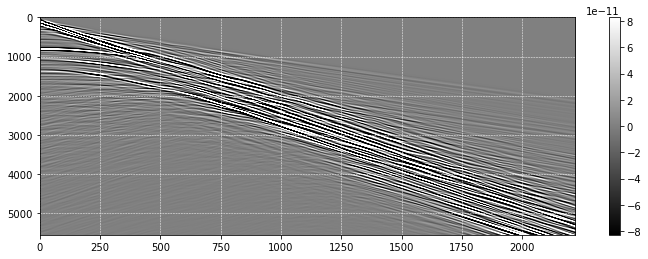

In [75]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

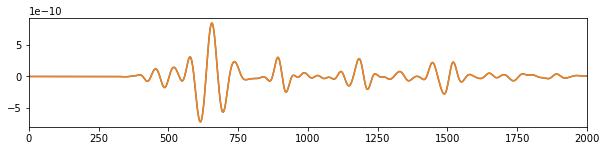

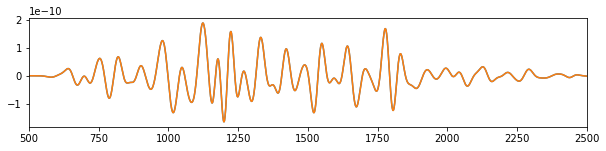

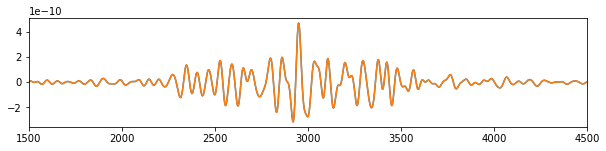

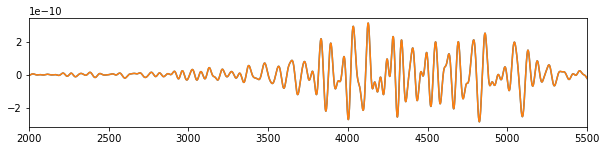

In [76]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### ez-vx

0.9999834


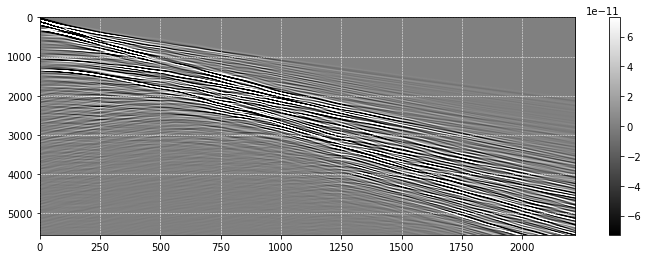

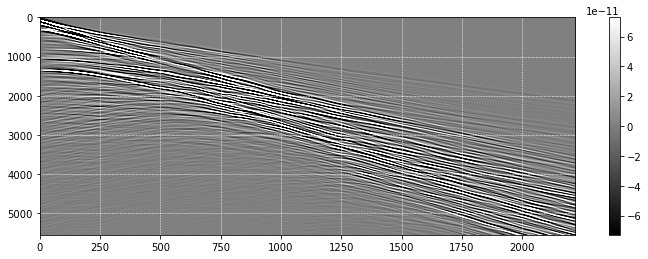

In [77]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

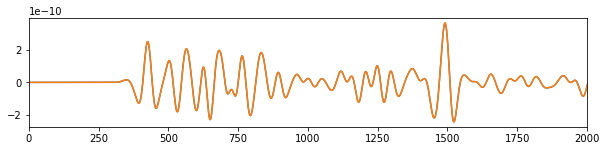

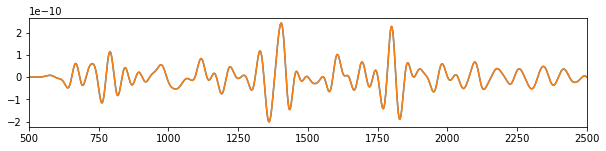

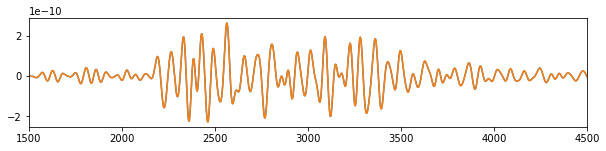

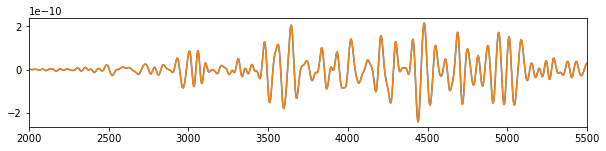

In [78]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

### ex source

In [79]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         ex" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ex" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:31:39
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ex
 Output directory:res_PE_overth_ex/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ex-vz

1.0000782


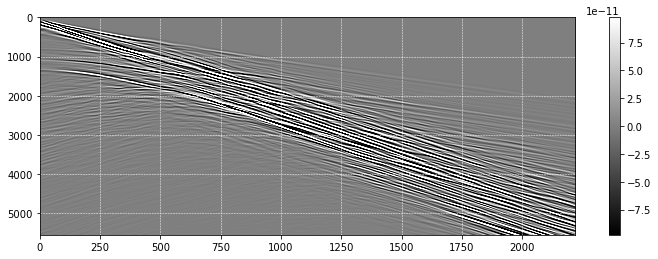

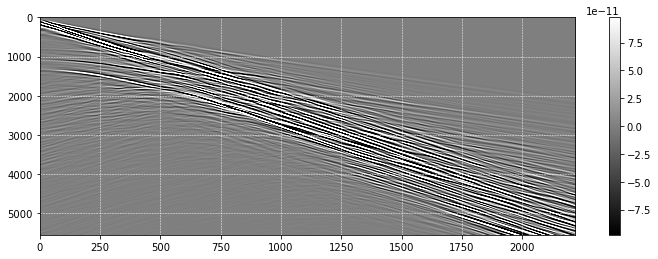

In [88]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

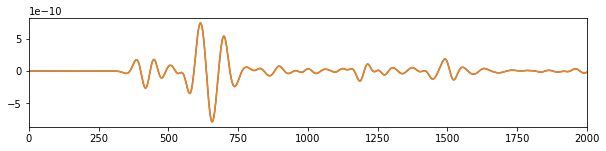

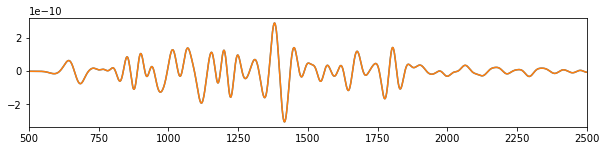

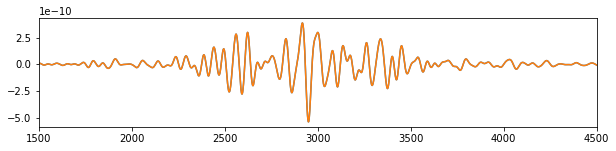

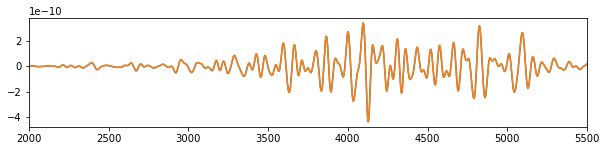

In [89]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### ex-vx

0.9999018


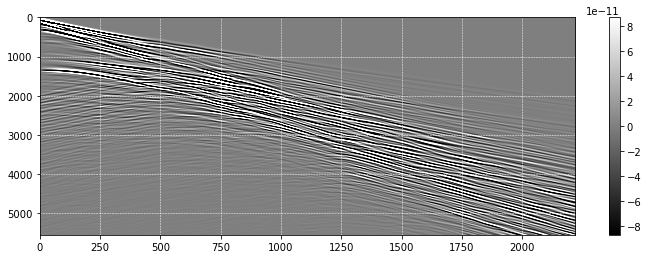

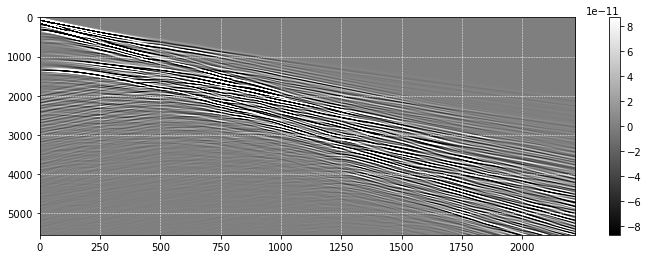

In [92]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

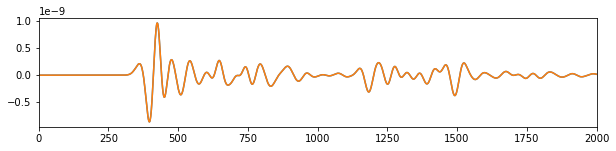

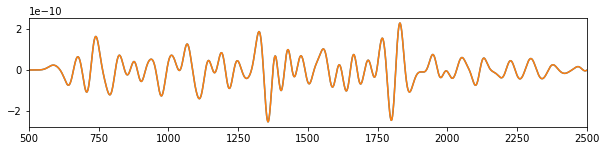

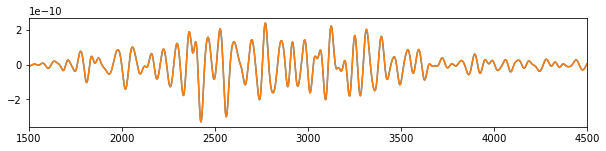

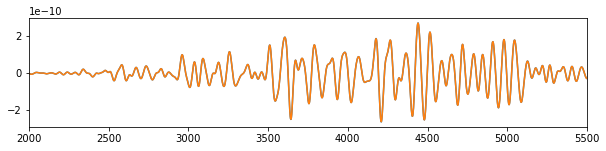

In [93]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

## Valid PE vs VS -- close to FreeSurf

In [94]:
vp = np.interp(np.arange(ntr)/2, np.arange(nx), np.average(true[:1,:nx    ],axis=0) )
vs = np.interp(np.arange(ntr)/2, np.arange(nx), np.average(true[:1,nx:2*nx],axis=0) )

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

### vz or pz force

In [95]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 679256 Mar 29 15:14 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:38:30
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth
 Output directory:res_VS_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

In [96]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR         '  3     0  0'" >> setup
!echo "SCOMP         pz" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:38:53
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth
 Output directory:res_PE_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

#### vz-szz

1.0154223778287434


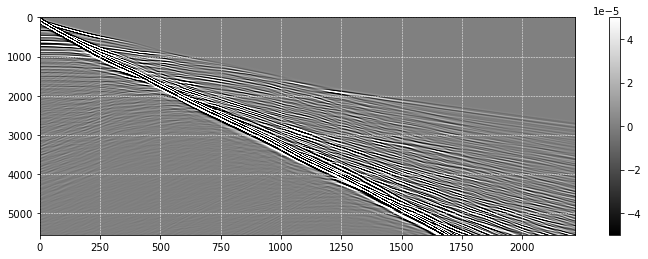

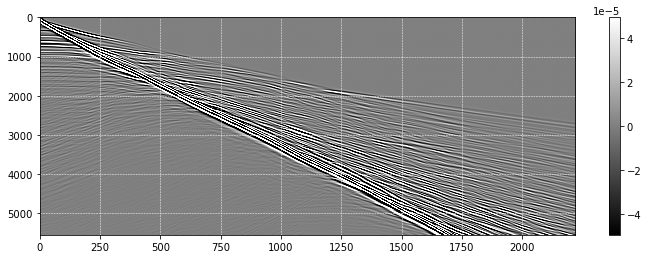

In [97]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

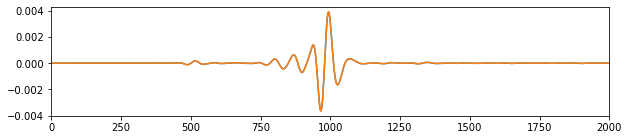

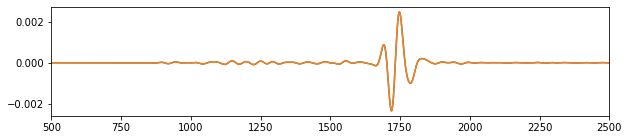

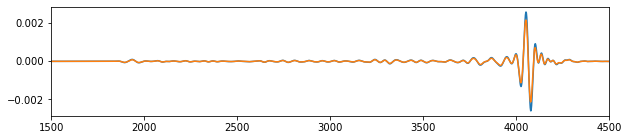

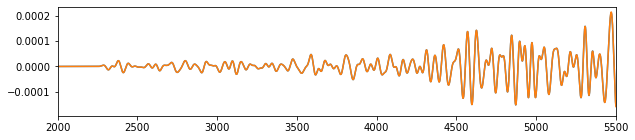

In [98]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-sxx

1.008223491169223


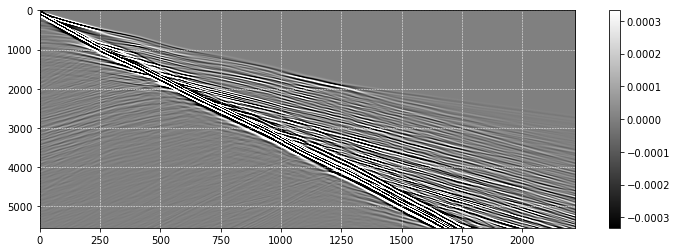

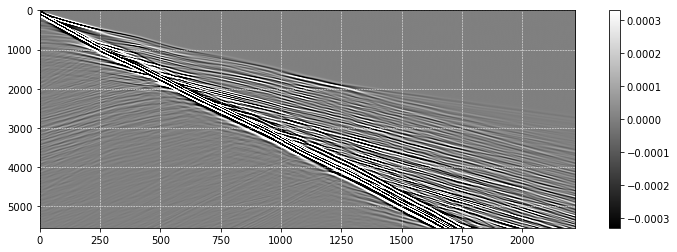

In [99]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

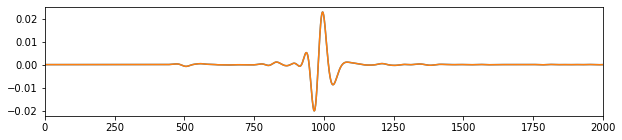

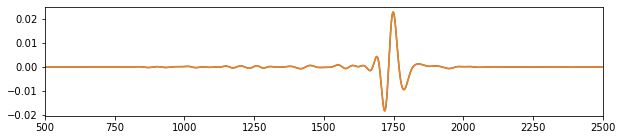

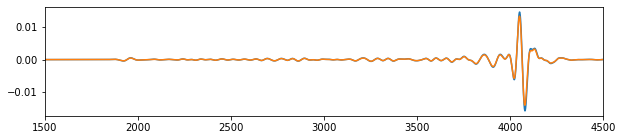

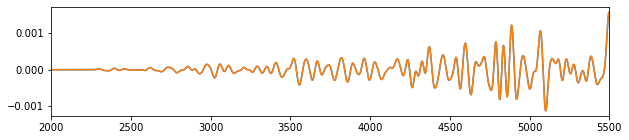

In [100]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ez

1.006458843715183


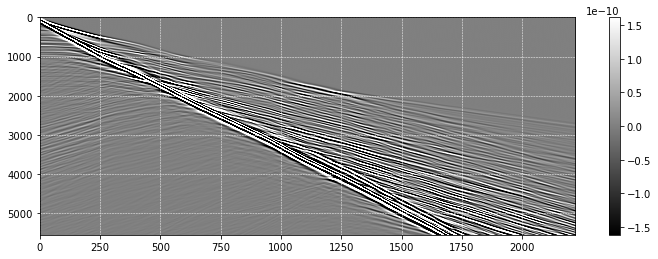

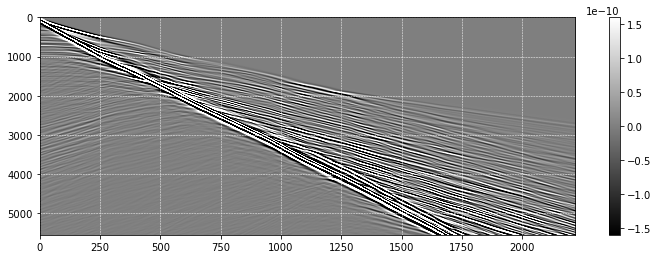

In [101]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

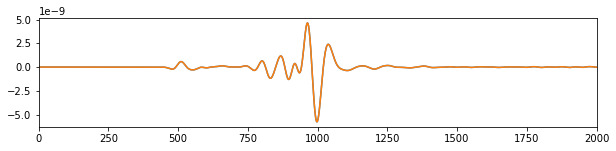

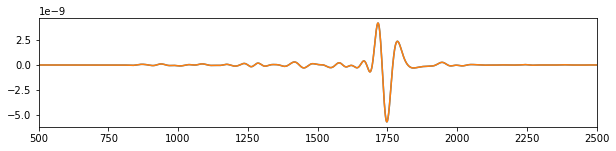

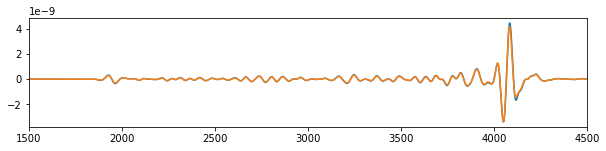

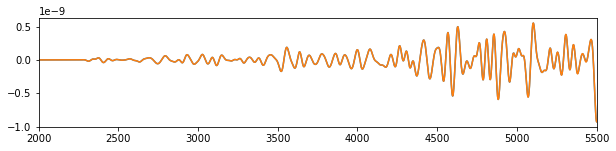

In [102]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ex

1.008837824867849


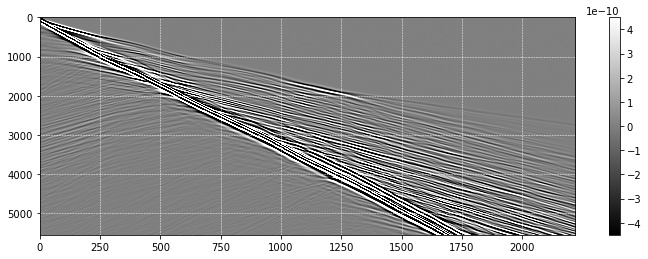

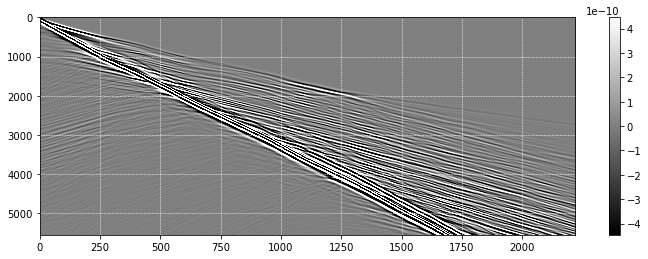

In [103]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

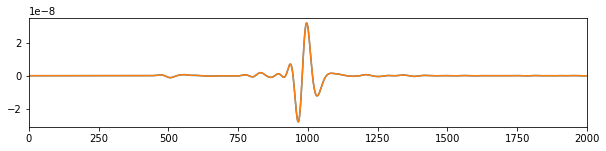

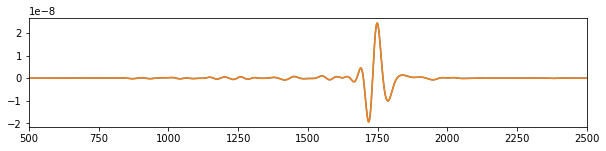

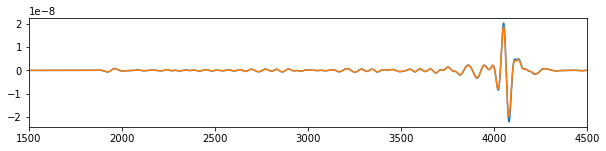

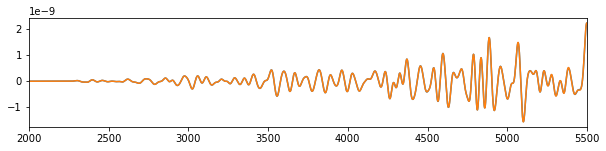

In [104]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ss-es

1.0062424499814044


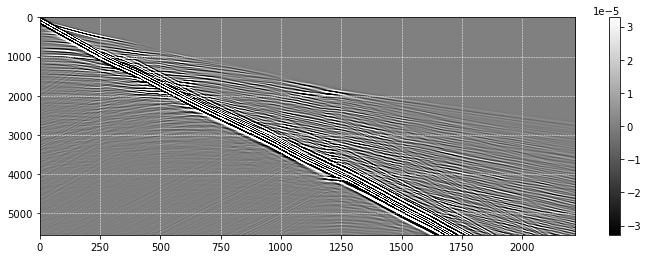

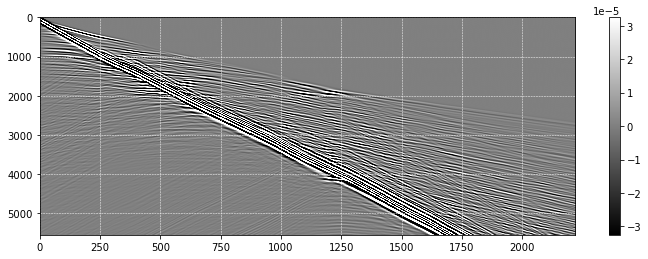

In [105]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

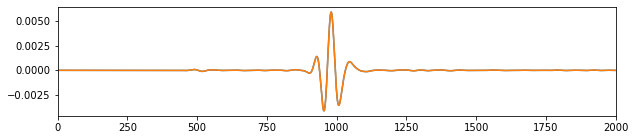

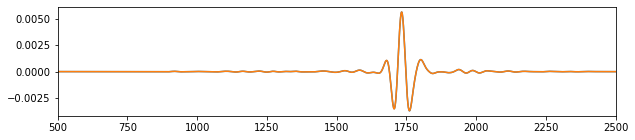

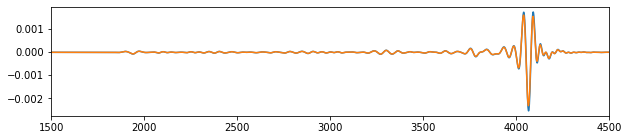

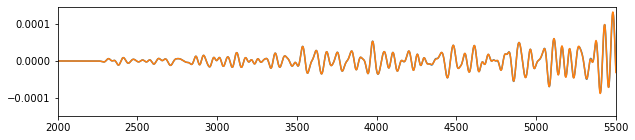

In [106]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

### vx or px force

In [119]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         vx" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth_vx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 679256 Mar 29 15:14 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:40:26
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_vx
 Output directory:res_VS_overth_vx/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

In [120]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         px" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth_px" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 669792 Mar 29 15:14 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:40:53
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_px
 Output directory:res_PE_overth_px/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### vx-szz

1.014352918357118


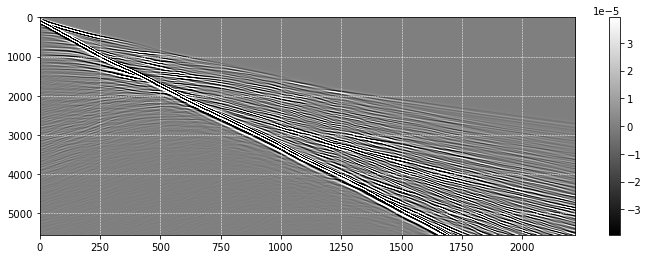

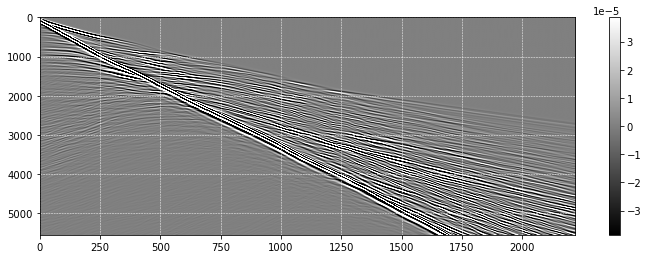

In [121]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

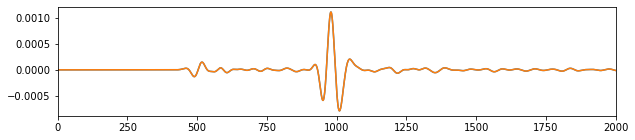

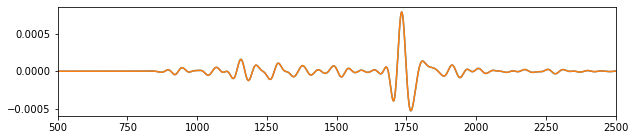

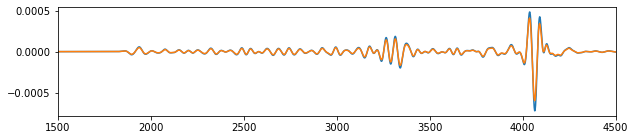

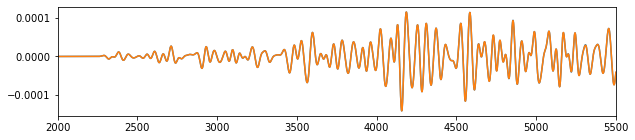

In [122]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-sxx

1.0079751222898379


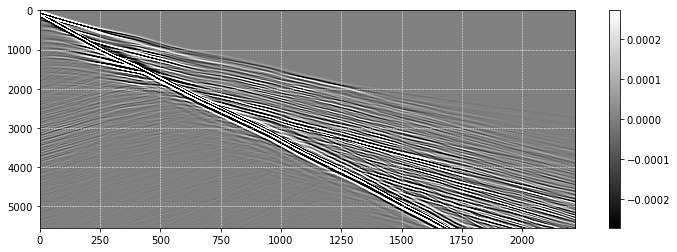

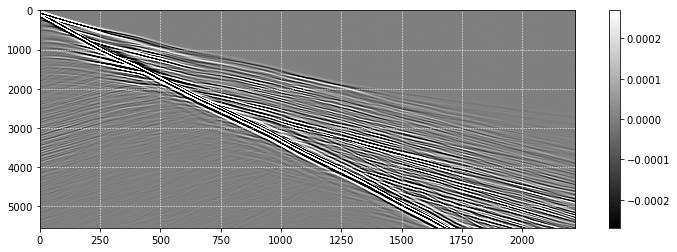

In [123]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

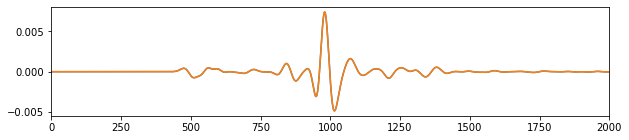

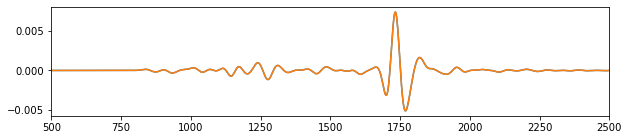

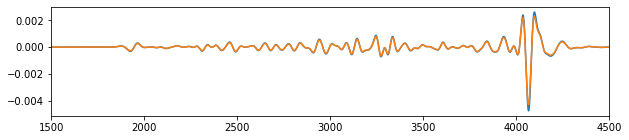

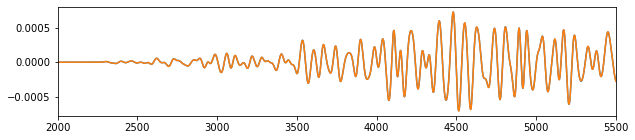

In [124]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ez

1.0082357397734605


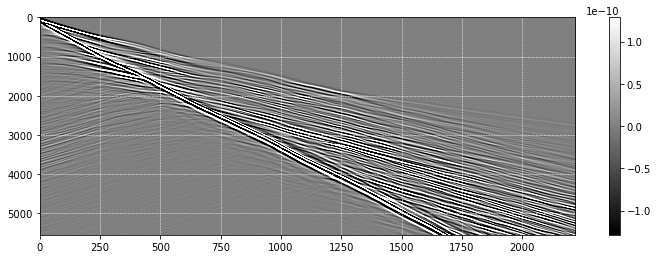

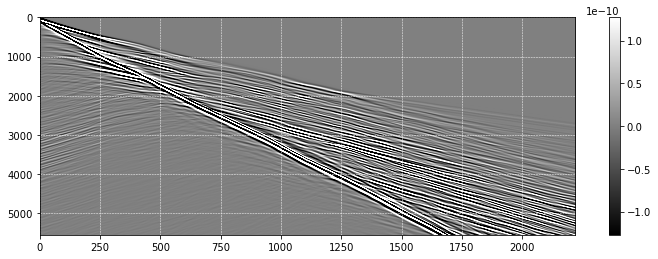

In [125]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

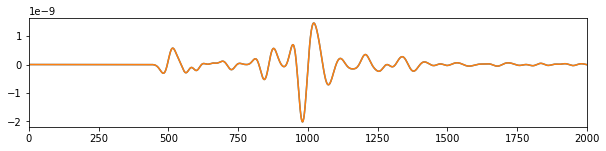

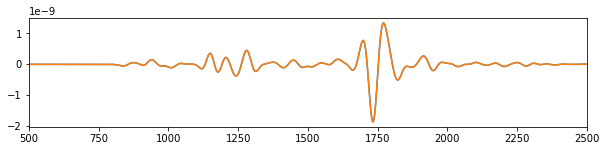

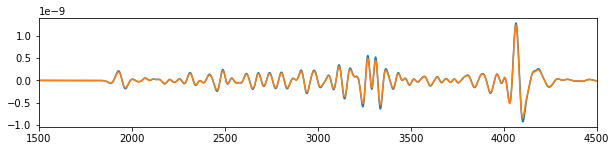

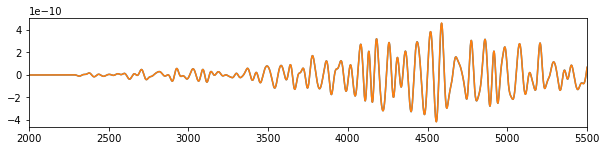

In [126]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ex

1.008515150504024


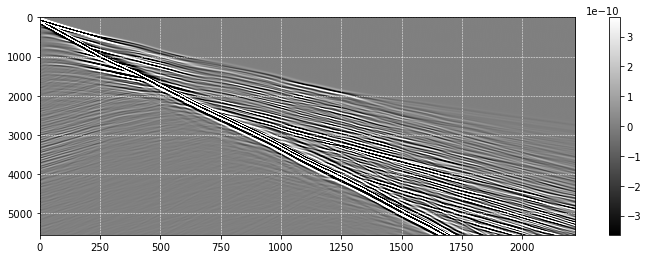

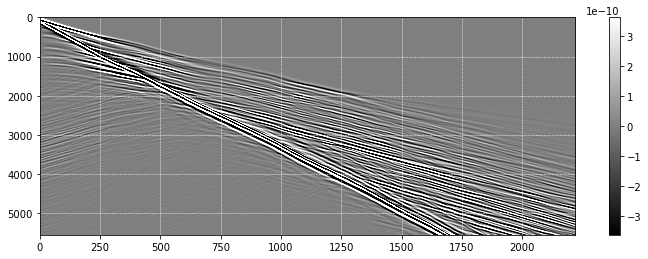

In [127]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

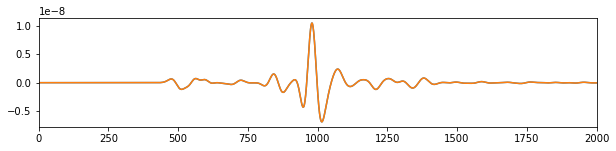

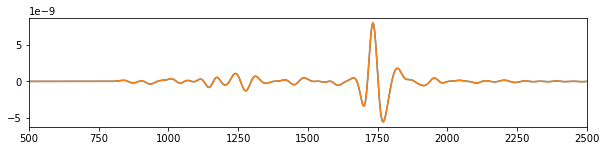

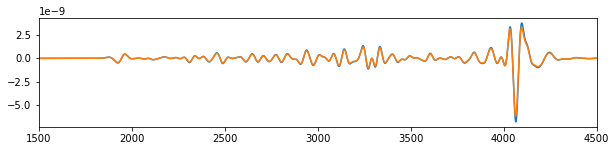

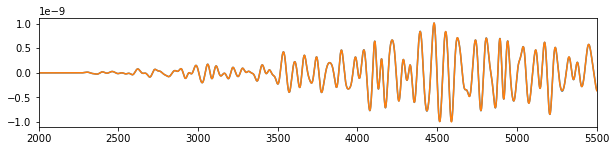

In [128]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ss-es

1.0062947825195832


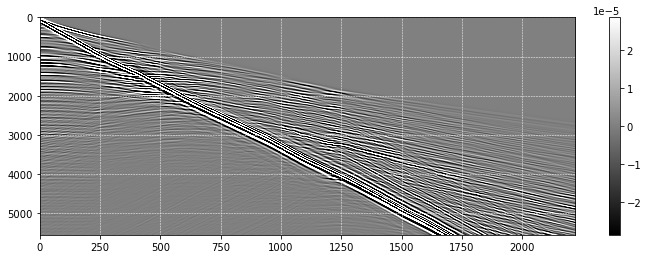

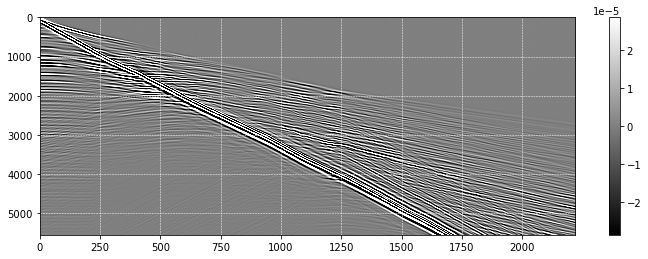

In [129]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

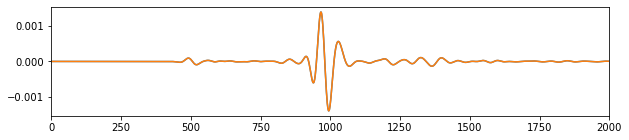

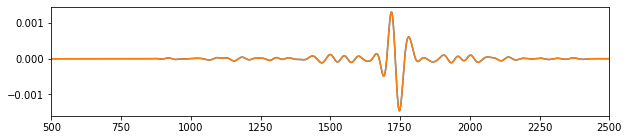

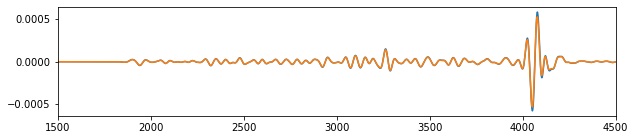

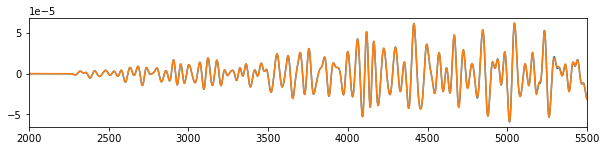

In [130]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

## Valid PE vs VS -- close to FreeSurf

In [131]:
vp = np.average(true[0:1,0 ])
vs = np.average(true[0:1,nx])

print(vp,vs)

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

863.9864 498.82275


### ez source

In [141]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         szz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sz" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         sxx" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 684224 Mar 29 15:51 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 15:51:32
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_sz
 Output directory:res_VS_overth_sz/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

 MODEL_ATTRIBUTES_WRITE : vp vs
 vp model is read.
 vs model is read.
 rho model is read.
 IS_FREESURFACE : T
 FILE_BATHYMETRY (FILE_BATHY) is NOT found, take 0, '' or F
 FILE_TOPOGRAPHY (FILE_TOPO) : none
 File none has 0 size or does NOT exist, return empty filename.
 IF_BATHY_FROM_VS is NOT found, take default: T
 Freeze zone is additionally set from vs model.
 FILE_FREEZE_ZONE is NOT found, take 0, '' or F
 ACQUI_GEOMETRY : spread
 NUMBER_SOURCE (NS) : 1
 Will compute 1 synthetic shots.
 FILE_SHOT_BATCH is NOT found, take 0, '' or F
 SHOT_BATCH_SIZE (NBATCH) : 39
 SHOT_SAMPLE_METHOD is NOT found, take default: cyclic
 Proc0001 has 1 assigned shots
 See file "shotlist.log" for details.
 ===== START LOOP OVER SHOTS =====
 TIME_STEP (NT) : 5554
 TIME_INTERVAL (DT) : 0.0018
 SOURCE_COMPONENT (SCOMP) : sxx
 ACQUI_GEOMETRY : spread
 SOURCE_FIRST (FS) : 3     0  0
 RECEIVER_FIRST (FR) : 3     0  0
 SOURCE_SPACING (DS) : 0   166.5  0
 RECEIVER_SPACING (DR) : 0     3  0
 NUMBER_RECEIVER (NR

In [167]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         ez" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ez" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 674656 Mar 29 16:00 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:01:09
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ez
 Output directory:res_PE_overth_ez/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ez-vz

1.78194


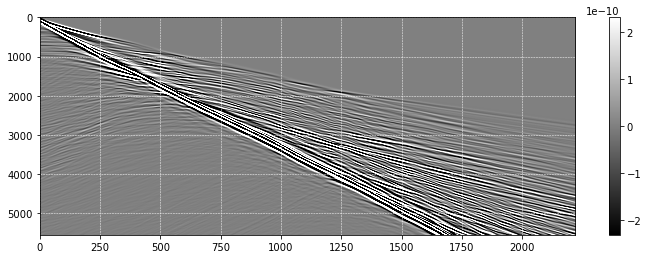

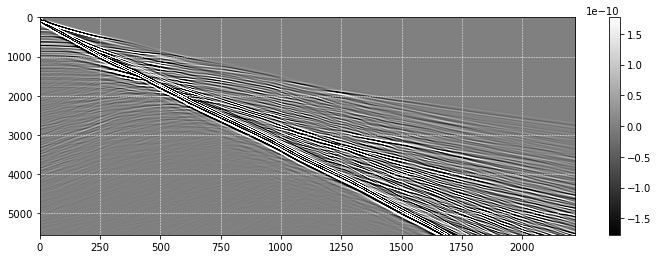

In [201]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

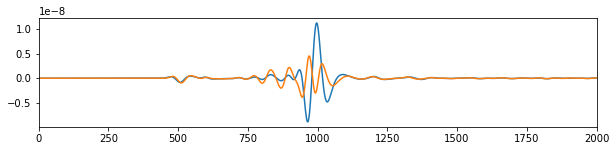

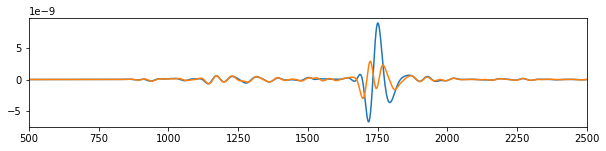

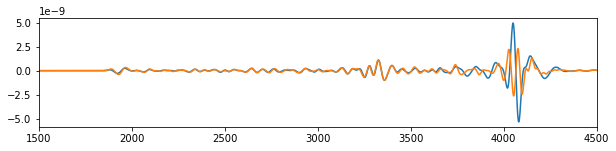

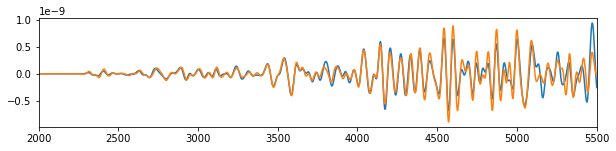

In [202]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((2000, 5500))

#### ez-vx

1.5578096


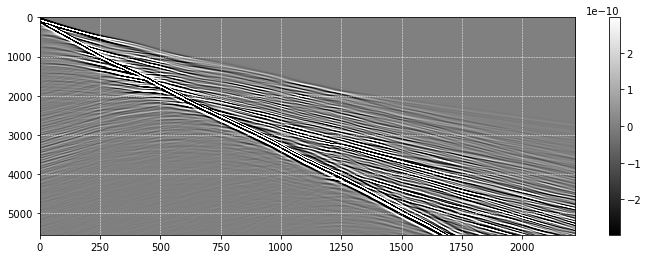

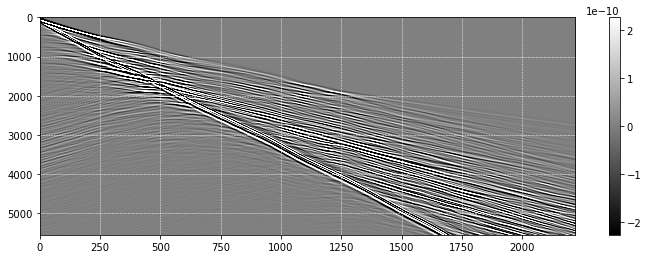

In [203]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

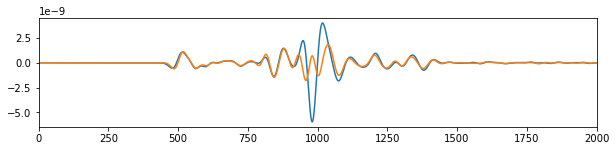

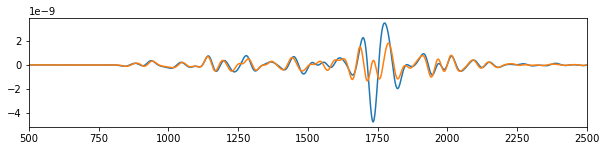

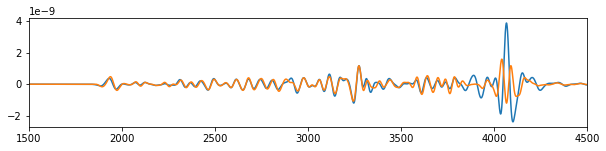

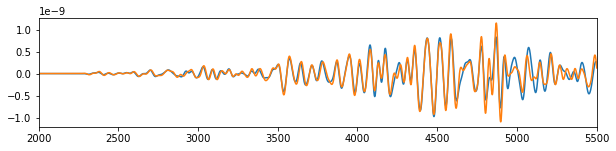

In [204]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((2000, 5500))

### ex source

In [176]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         ex" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ex" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 674656 Mar 29 16:08 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:08:28
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ex
 Output directory:res_PE_overth_ex/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ex-vz

2.175782


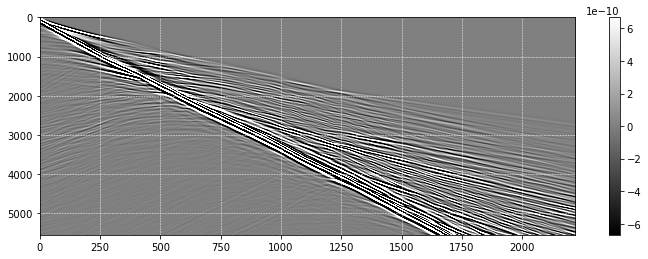

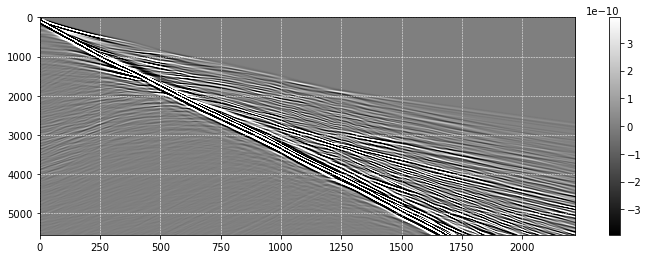

In [205]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

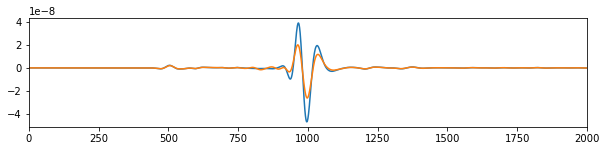

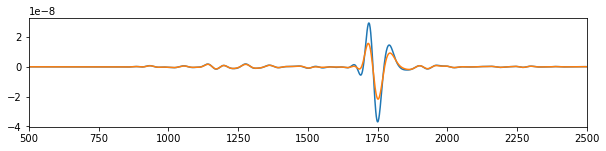

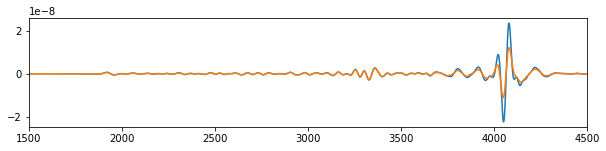

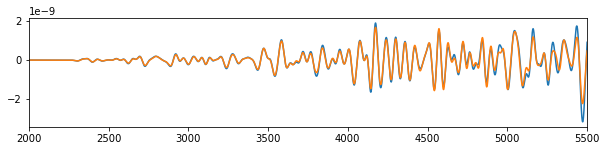

In [206]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((2000, 5500))

#### ex-vx

1.9190739


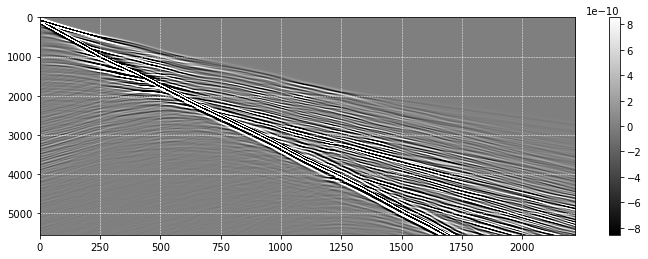

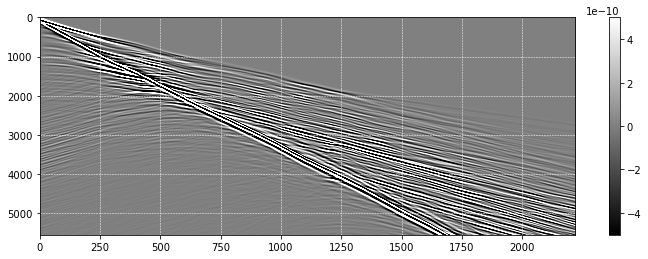

In [207]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

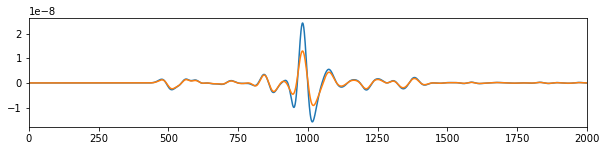

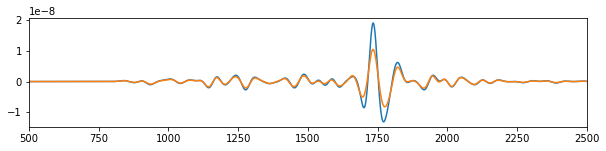

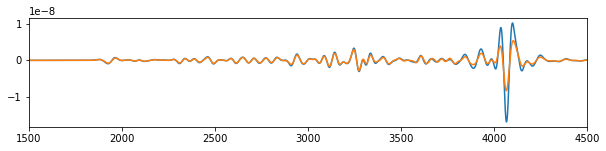

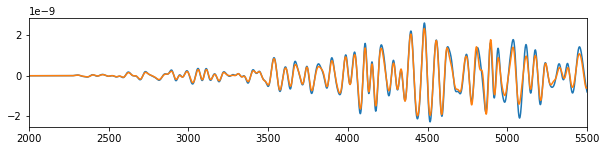

In [208]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((2000, 5500))

## Valid PE vs VS -- on FreeSurf

In [6]:
vp = np.interp(np.arange(ntr)/2, np.arange(nx), true[0,:nx    ] )
vs = np.interp(np.arange(ntr)/2, np.arange(nx), true[0,nx:2*nx] )

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

### vz or pz force

In [7]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 684112 Mar 29 16:33 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:34:30
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth
 Output directory:res_VS_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

In [10]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         pz" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 675016 Mar 29 16:34 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:35:11
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth
 Output directory:res_PE_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

#### vz-szz

0.0


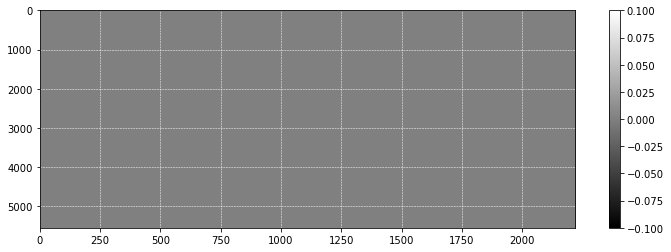

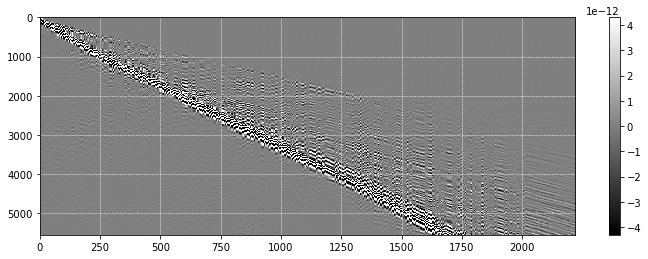

In [11]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

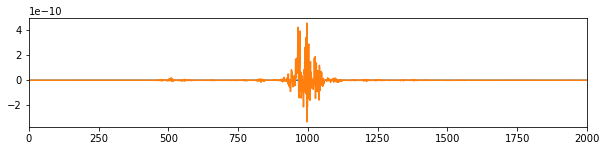

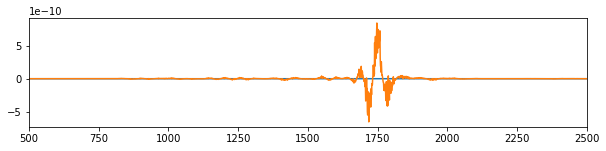

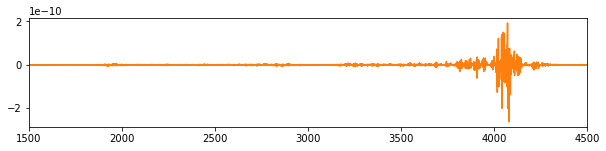

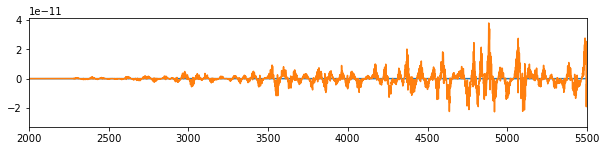

In [12]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-sxx

1.000052973005228


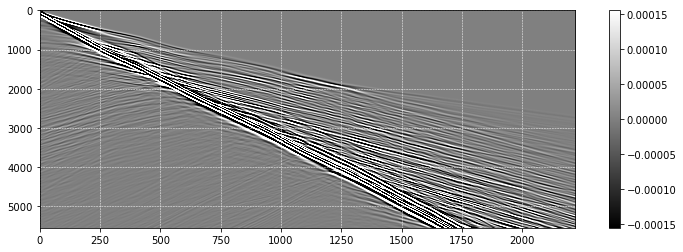

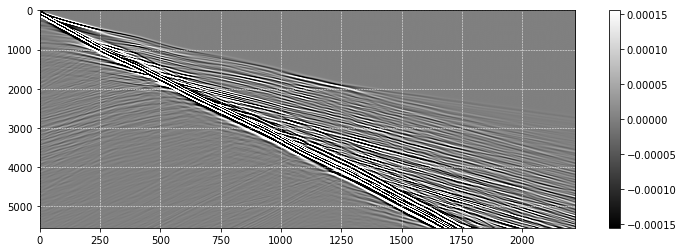

In [13]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

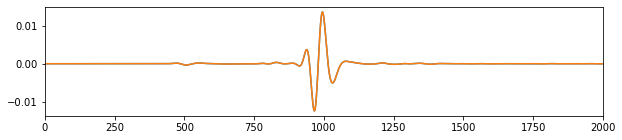

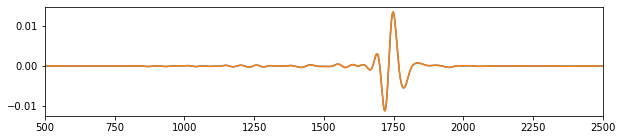

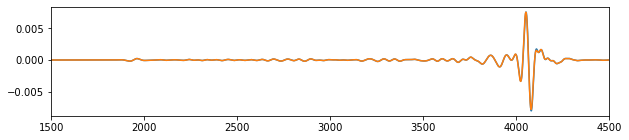

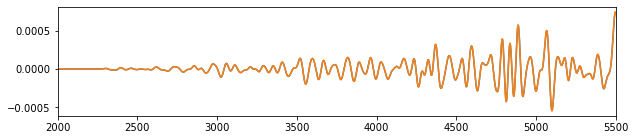

In [14]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ez

1.000062118472987


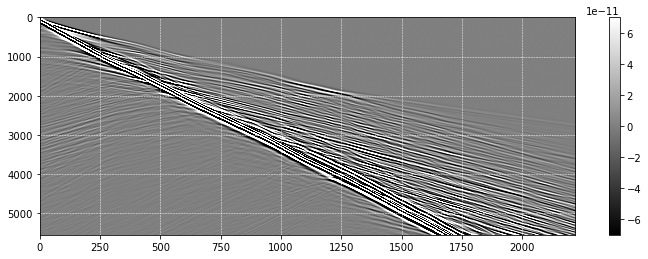

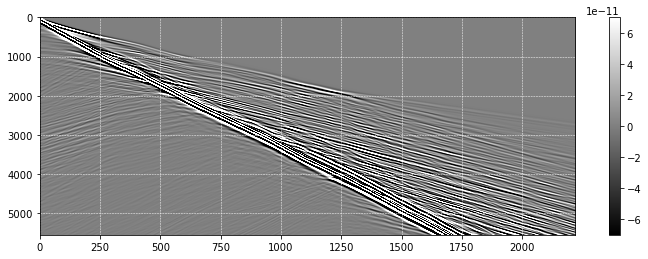

In [15]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

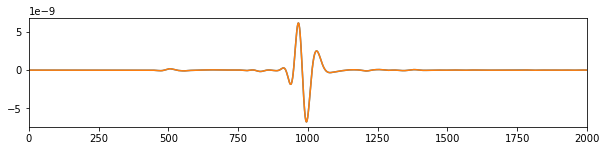

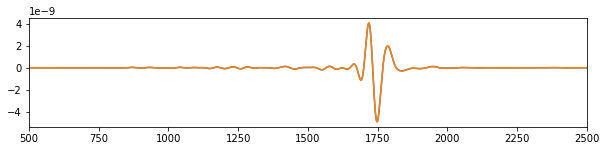

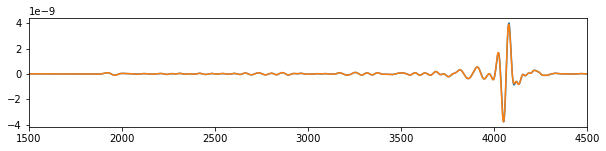

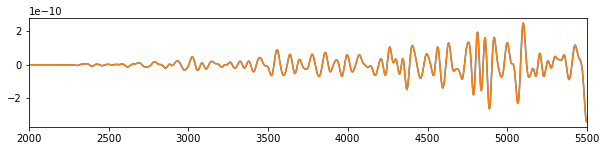

In [16]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vz-ex

1.0000620707761392


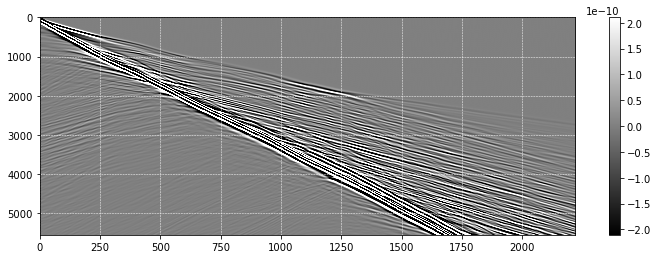

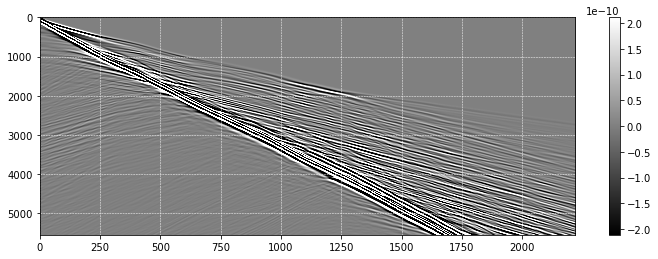

In [17]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

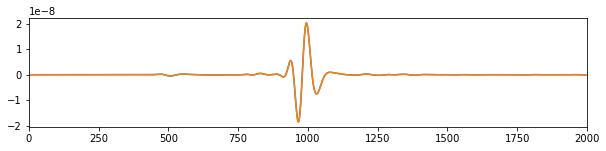

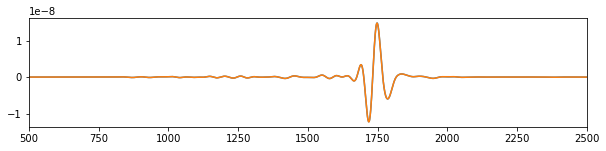

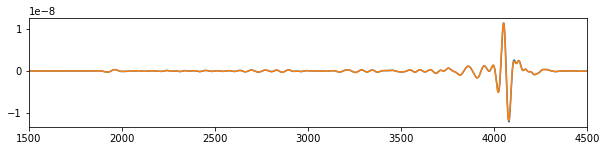

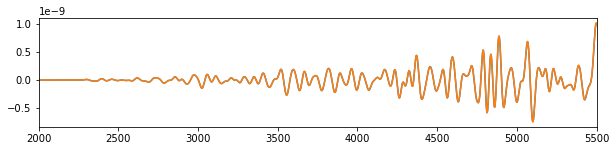

In [18]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

### vx or px force

In [19]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         vx" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth_vx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 684112 Mar 29 16:33 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:35:55
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_vx
 Output directory:res_VS_overth_vx/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

In [20]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         px" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth_px" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 675016 Mar 29 16:34 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:36:21
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_px
 Output directory:res_PE_overth_px/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### vx-szz

0.0


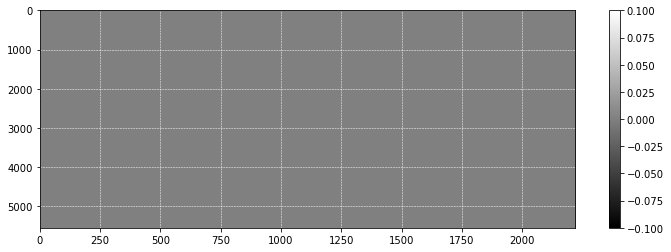

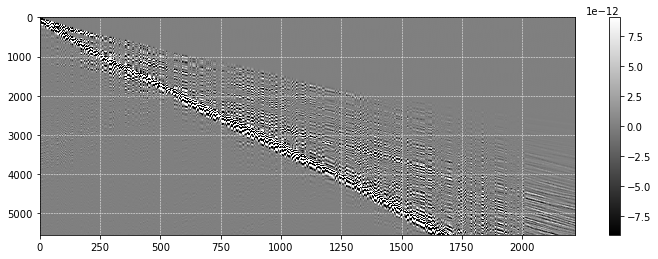

In [21]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

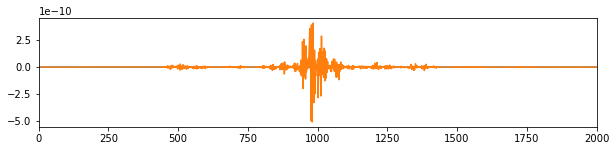

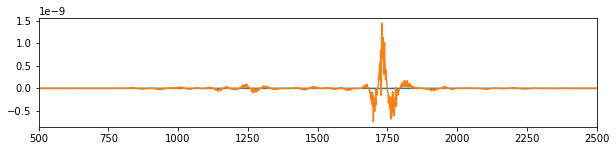

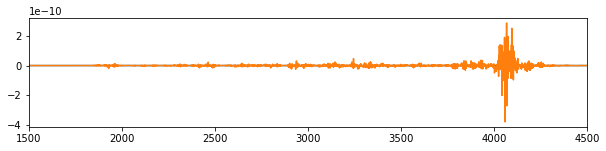

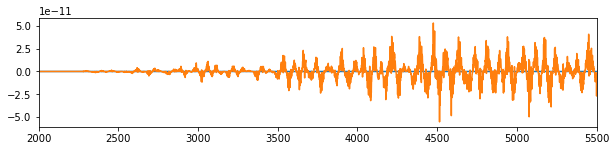

In [22]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-sxx

0.9997632838791849


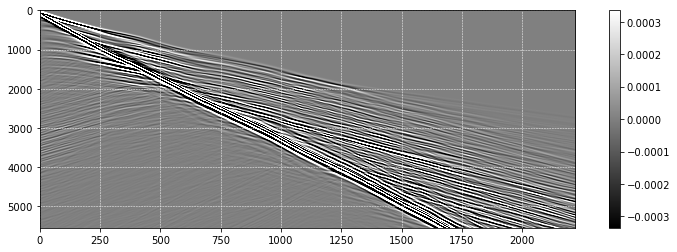

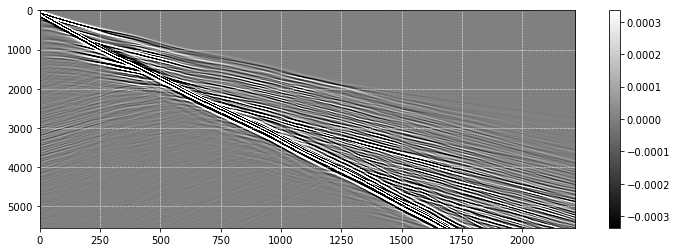

In [23]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

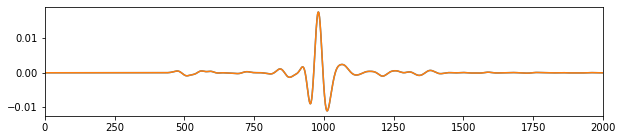

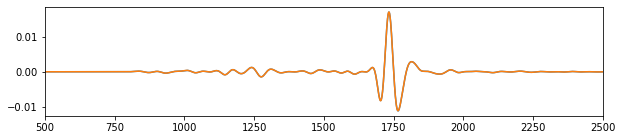

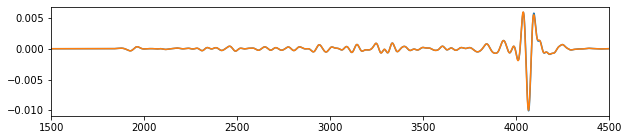

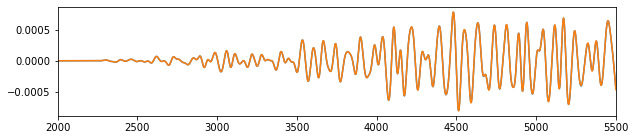

In [24]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ez

0.9997837224864956


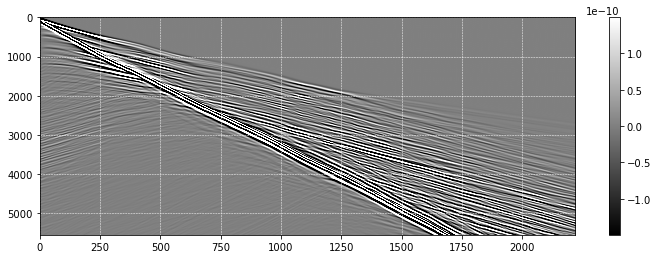

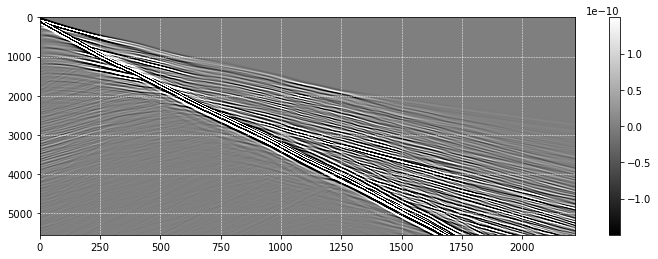

In [25]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

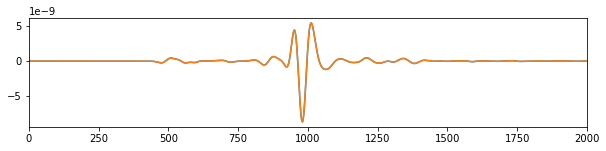

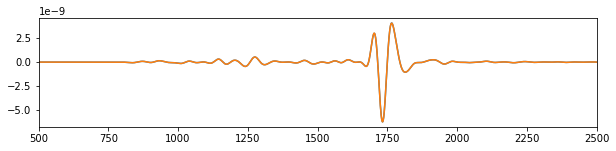

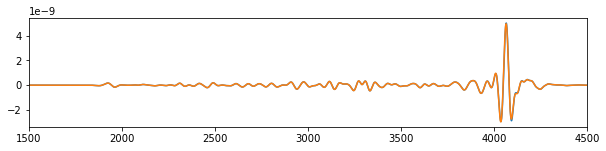

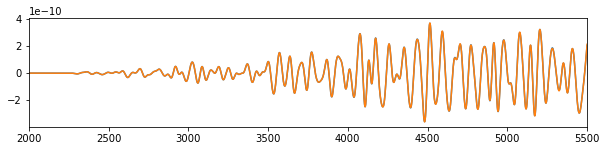

In [26]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ex

0.9997827107461663


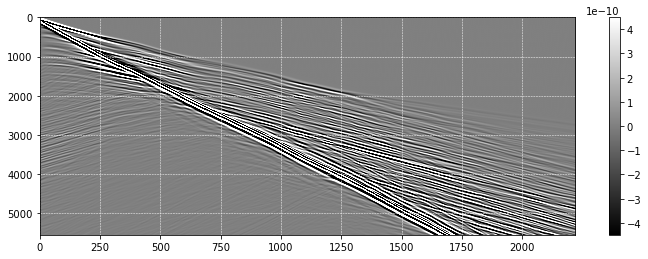

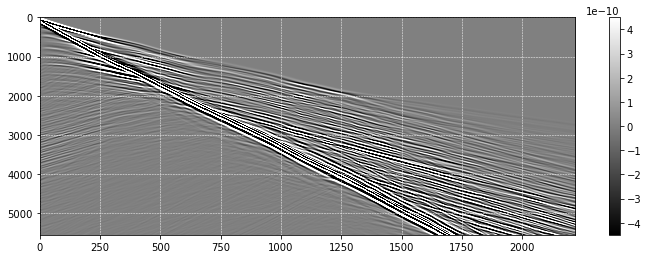

In [27]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

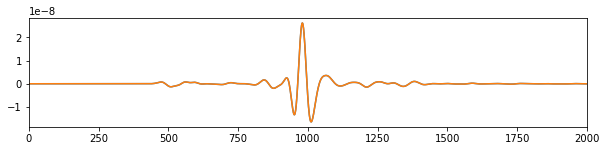

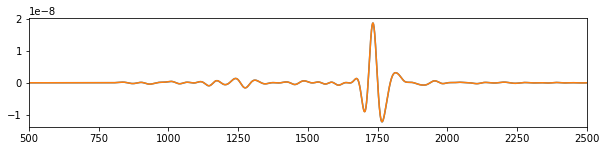

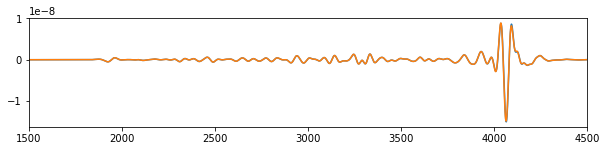

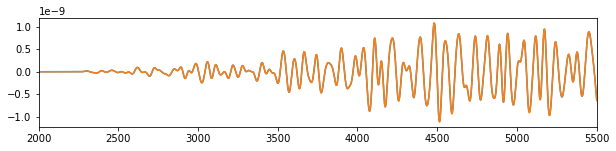

In [28]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

#### vx-ss-es

0.9976552460117337


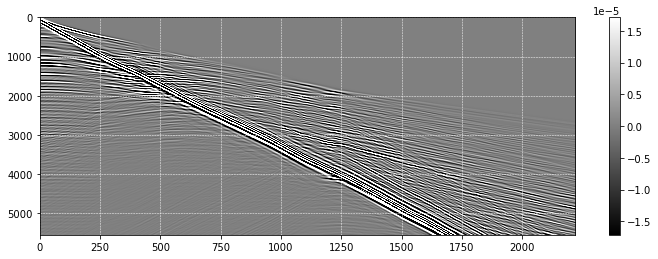

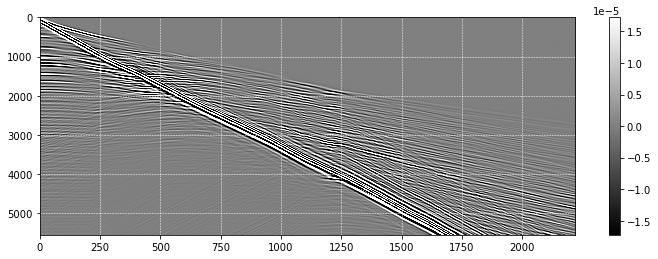

In [29]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

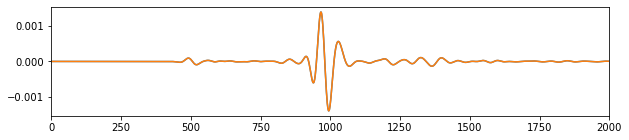

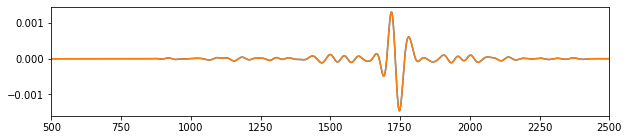

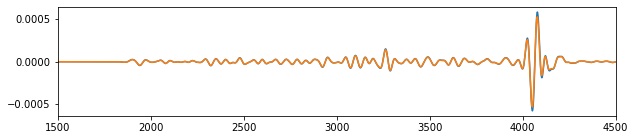

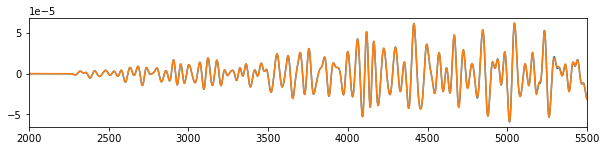

In [130]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr])
plt.xlim((2000, 5500))

## Valid PE vs VS -- on FreeSurf

In [30]:
vp = true[0,0 ]
vs = true[0,nx]

print(vp,vs)

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

863.9864 498.82275


### ez source

In [31]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         szz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sz" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         sxx" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 684112 Mar 29 16:33 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:37:27
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_sz
 Output directory:res_VS_overth_sz/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

 vs model is read.
 rho model is read.
 IS_FREESURFACE : T
 FILE_BATHYMETRY (FILE_BATHY) is NOT found, take 0, '' or F
 FILE_TOPOGRAPHY (FILE_TOPO) : none
 File none has 0 size or does NOT exist, return empty filename.
 IF_BATHY_FROM_VS is NOT found, take default: T
 Freeze zone is additionally set from vs model.
 FILE_FREEZE_ZONE is NOT found, take 0, '' or F
 ACQUI_GEOMETRY : spread
 NUMBER_SOURCE (NS) : 1
 Will compute 1 synthetic shots.
 FILE_SHOT_BATCH is NOT found, take 0, '' or F
 SHOT_BATCH_SIZE (NBATCH) : 39
 SHOT_SAMPLE_METHOD is NOT found, take default: cyclic
 Proc0001 has 1 assigned shots
 See file "shotlist.log" for details.
 ===== START LOOP OVER SHOTS =====
 TIME_STEP (NT) : 5554
 TIME_INTERVAL (DT) : 0.0018
 SOURCE_COMPONENT (SCOMP) : sxx
 ACQUI_GEOMETRY : spread
 SOURCE_FIRST (FS) : 0     0  0
 RECEIVER_FIRST (FR) : 0     0  0
 SOURCE_SPACING (DS) : 0   166.5  0
 RECEIVER_SPACING (DR) : 0     3  0
 NUMBER_RECEIVER (NR) : 2220
 RECEIVER_COMPONENT (RCOMP) : vz vx
 PEAK_

In [42]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         ez" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ez" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 674672 Mar 29 16:39 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:39:48
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ez
 Output directory:res_PE_overth_ez/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ez-vz

1.6904236


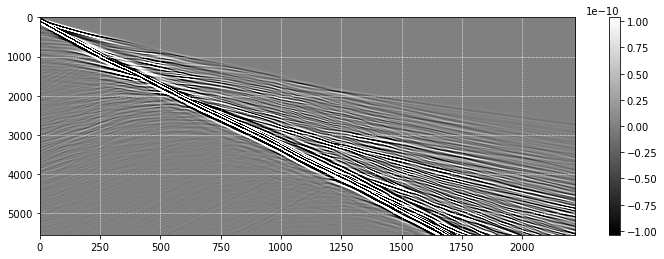

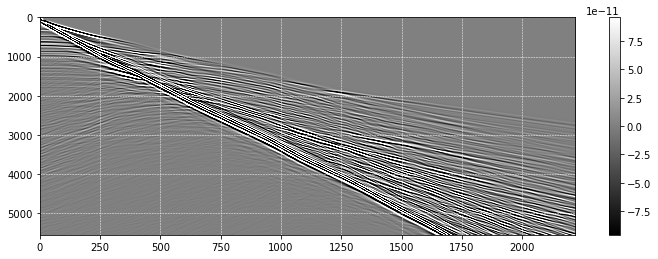

In [43]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

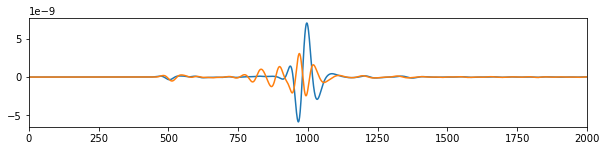

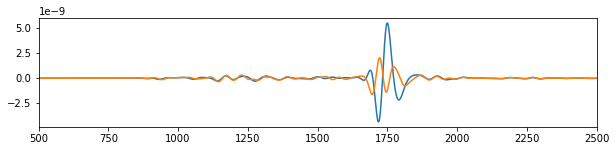

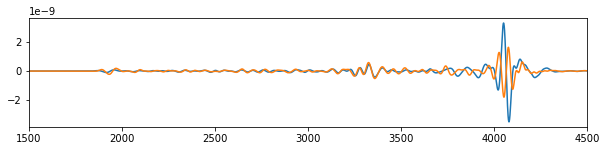

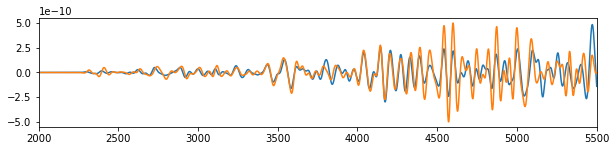

In [44]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.335)
plt.xlim((2000, 5500))

#### ez-vx

1.4808013


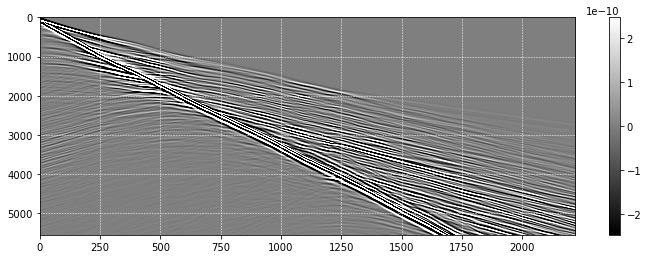

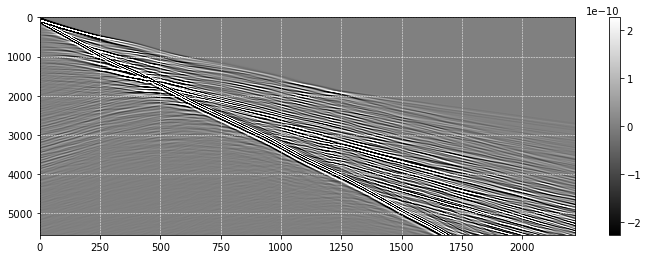

In [45]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

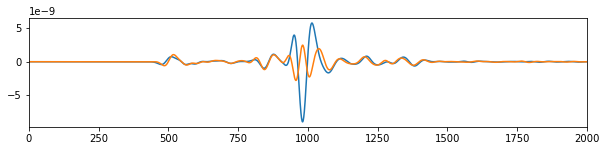

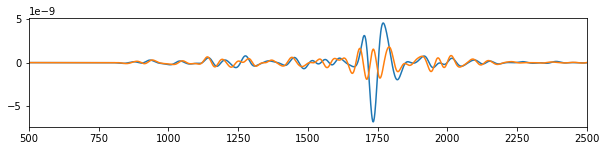

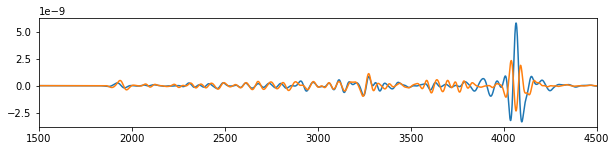

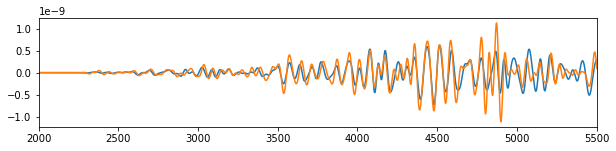

In [46]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.25)
plt.xlim((2000, 5500))

### ex source

In [47]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '0     0  0'" >> setup
!echo "FR           '0     0  0'" >> setup
!echo "SCOMP         ex" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ex" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 674672 Mar 29 16:39 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 3320c20
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/29/2024
System time: 16:40:26
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ex
 Output directory:res_PE_overth_ex/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ex-vz

2.1331859


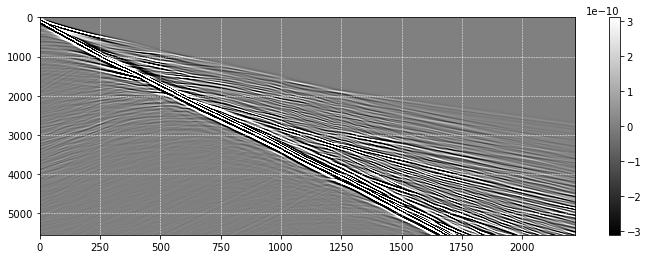

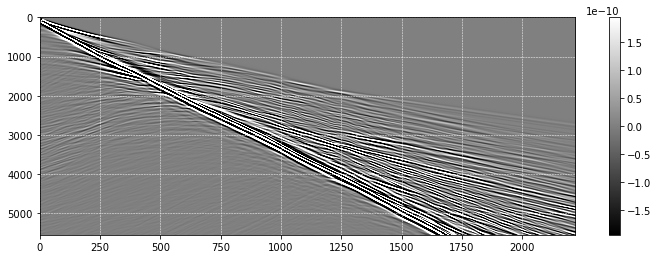

In [48]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

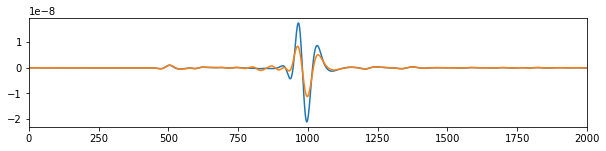

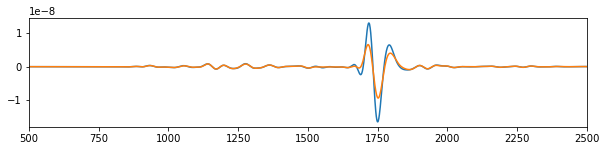

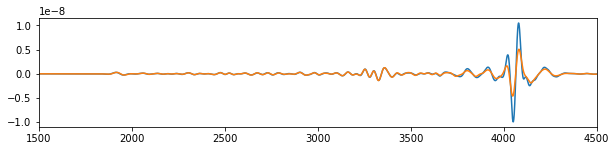

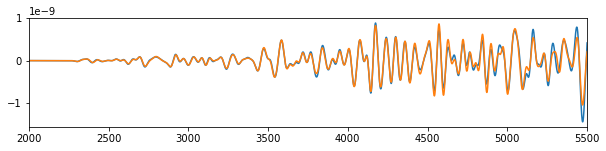

In [49]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.5)
plt.xlim((2000, 5500))

#### ex-vx

1.9203432


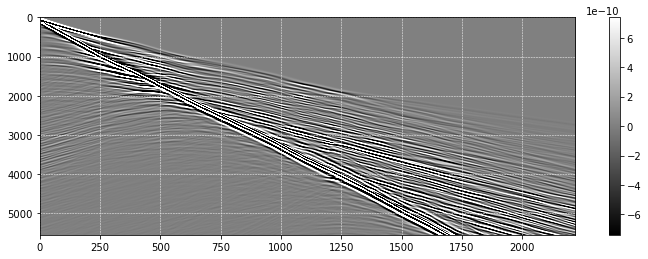

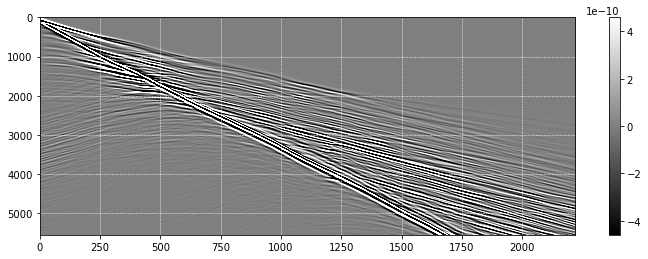

In [50]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1,perc=90,cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

(2000.0, 5500.0)

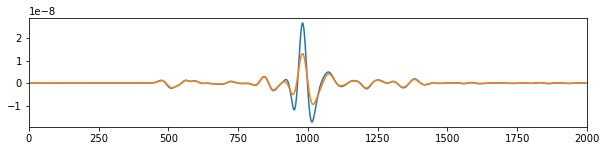

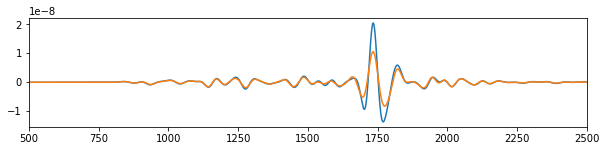

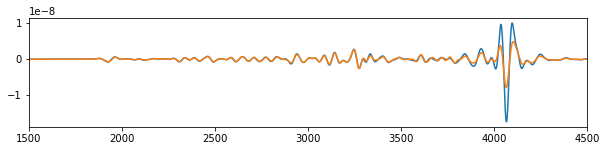

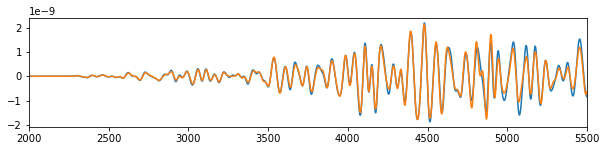

In [51]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1[:,itr]); plt.plot(data2[:,itr]*1.4)
plt.xlim((2000, 5500))